<a href="https://colab.research.google.com/github/OJB-Quantum/Notebooks-for-Ideas/blob/main/Nanobridge_Qubit_Candidate_Numerical_Computation_in_Colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Authored by Onri Jay Benally (2026)

Open Access (CC-BY-4.0)

In [11]:
!uv pip install -q numpy scipy pandas matplotlib qutip cupy-cuda12x

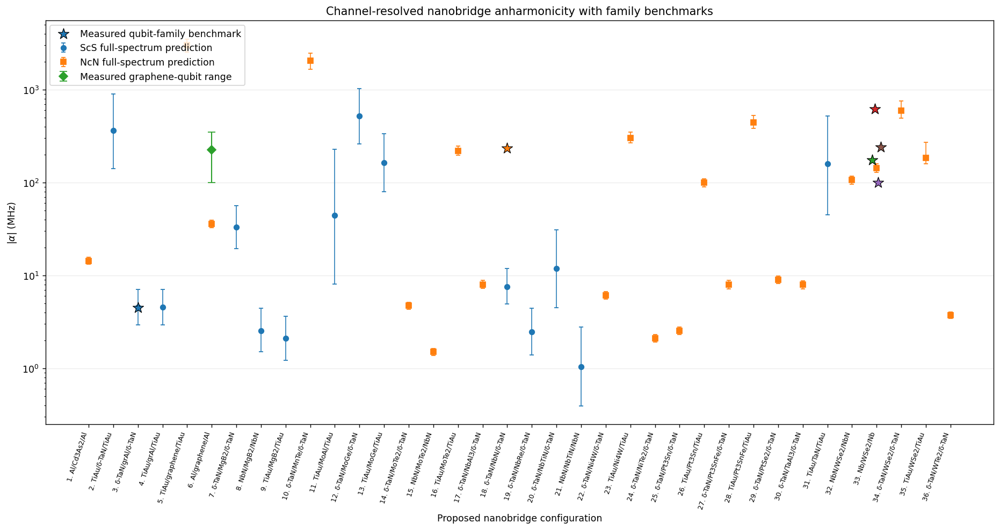

In [13]:
"""Predict nanobridge spectra and Rabi dynamics from material-specific models.

The workflow compares superconducting-constriction-superconducting (ScS) and
normal-metal/constriction/normal-metal (NcN) nanobridge candidates.
It combines an adjacency-network electrical reduction, graph-geometry-aware
Metropolis-Hastings sampling, channel-resolved semimetal transmissions, full
short-junction Andreev potentials, CuPy batched Hamiltonian diagonalization,
QuTiP eigensystem calculations, candidate-resolved anharmonic potential-energy plots,
and physics-informed thermal Rabi/coherence screening.

NcN candidates use

    U(phi) = -sum_i Delta_i sqrt(1 - tau_i sin(phi / 2)^2)

with node-, sector-, and mode-resolved transmission channels. The potential is
Fourier transformed and inserted directly into the charge-basis Hamiltonian

    H = 4 Ec (n - ng)^2 + U(phi).

The same stationary eigenvalues, eigenstates, and charge matrix elements feed
the rotating-wave Rabi calculation. Static rotating-frame Hamiltonians are
propagated spectrally, removing the ODE workload failure produced by ``zvode``.
Rabi comparisons can hold the effective 0-1 rate fixed, impose an
anharmonicity-limited selective drive, or reproduce the older equal-coupling
experiment. MCMC convergence is assessed with split rank-normalized R-hat and
bulk/tail effective sample sizes.

Exact-stack inputs tagged as proxies are hypothesis-generating. Measured Rn,
Ic, channel transmissions, induced gaps, capacitance, interface quality, and
film geometry should replace them before fabrication decisions.
"""

import math
from dataclasses import dataclass
from typing import Any

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import display
from scipy import optimize, sparse
from scipy.special import ndtri
from scipy.sparse import linalg as sparse_linalg
from scipy.stats import rankdata

try:
    from qutip import Qobj

    QUTIP_AVAILABLE = True
except Exception:
    Qobj = None
    QUTIP_AVAILABLE = False

try:
    import cupy as cp
    from cupyx.scipy import sparse as cupy_sparse
    from cupyx.scipy.sparse import linalg as cupy_sparse_linalg

    CUPY_AVAILABLE = cp.cuda.runtime.getDeviceCount() > 0
except Exception:
    cp = None
    cupy_sparse = None
    cupy_sparse_linalg = None
    CUPY_AVAILABLE = False


# -----------------------------------------------------------------------------
# CONTROL KNOBS
# -----------------------------------------------------------------------------

USE_CUPY = True
MCMC_USE_GPU = True
USE_QUTIP_EIGENSOLVER = True
PLOT_DPI = 125

# "frequency_normalized" compares materials after designing every qubit near
# TARGET_FREQUENCY_GHZ. "fixed_capacitance" predicts the frequency obtained
# from one shared capacitor value.
DESIGN_MODE = "frequency_normalized"
TARGET_FREQUENCY_GHZ = 6.0
TARGET_CAPACITANCE_FF = 100.0
OPERATING_TEMPERATURE_MK = 20.0
OFFSET_CHARGE_NG = 0.0

BRIDGE_LENGTH_NM = 500.0
BRIDGE_WIDTH_NM = 80.0
GRID_NX = 21
GRID_NY = 7
ELECTRODE_SERIES_SQUARES_PER_SIDE = 0.05

APPLY_SC_GAP_CURRENT_LIMIT = True
SC_GAP_CURRENT_EXPONENT = 1.0

# The TiAu lead width and depairing current are unspecified. Treat its broad
# electrodes as reservoirs instead of multiplying the constrictor current scale
# by the very small TiAu-to-link gap ratio. Replace this exemption with a
# measured TiAu lead critical current once the fabricated geometry is known.
SC_GAP_LIMIT_EXEMPT_ELECTRODES = ("TiAu",)

CALIBRATE_SC_KERR_TO_GRAL = True
GRAL_MEASURED_ALPHA_MHZ = 4.48

PROXIMITY_RN_SCALE = 1.0
PROXIMITY_ICRN_SCALE = 1.0

# Channel-resolved Andreev model.
PHASE_GRID_POINTS = 256
MIN_CHARGE_CUTOFF = 14
MAX_CHARGE_CUTOFF = 80
CHARGE_CUTOFF_WIDTH_FACTOR = 6.0
CHARGE_CUTOFF_PADDING = 8.0
INCLUDE_4PI_COMPONENTS = False
FOUR_PI_GLOBAL_SCALE = 1.0
MAX_FOUR_PI_CURVATURE_FRACTION = 0.20

# A small mode enables a quick CPU or notebook check. Production settings use
# longer chains and adaptive random-walk scaling so convergence diagnostics are
# more meaningful before candidate comparisons are interpreted quantitatively.
FAST_TEST_MODE = False
MCMC_SEED = 20260818
MCMC_CHAINS = 6 if FAST_TEST_MODE else 48
MCMC_STEPS = 120 if FAST_TEST_MODE else 1200
MCMC_BURN_IN = 30 if FAST_TEST_MODE else 400
MCMC_THIN = 5 if FAST_TEST_MODE else 4
MCMC_PROPOSAL_SCALE = 0.22
MCMC_ADAPT_PROPOSAL = True
MCMC_ADAPT_INTERVAL = 20 if FAST_TEST_MODE else 50
MCMC_TARGET_ACCEPTANCE = 0.25
MCMC_ADAPT_GAIN = 0.80
MCMC_PROPOSAL_SCALE_MIN = 0.02
MCMC_PROPOSAL_SCALE_MAX = 1.00
MCMC_TARGET_FREQUENCY_SIGMA_MHZ = 350.0
MCMC_DIAGONALIZATION_BATCH = 32 if FAST_TEST_MODE else 128
MCMC_RHAT_THRESHOLD = 1.01
MCMC_MIN_BULK_ESS = 25 if FAST_TEST_MODE else 400
MCMC_MIN_TAIL_ESS = 25 if FAST_TEST_MODE else 400

# Geometric graph disorder controls. The name "adjacency" is reserved for the
# real-space network, leaving "band topology" for Dirac, Weyl, valley, surface,
# and hinge sectors.
ADJACENCY_MODES = 8
ADJACENCY_EFFECTIVE_LOG_STD = 0.08
ADJACENCY_SMOOTHNESS = 2.0

MCMC_CAPACITANCE_LOG_STD = 0.04
MCMC_INTERFACE_LOG_STD = 0.18
MCMC_CHANNEL_LOGIT_STD = 0.45
MCMC_SECTOR_GAP_LOG_STD = 0.08
MCMC_SCS_MODEL_LOG_STD = 0.12
MCMC_MIN_LEVEL_SPACING_MHZ = 1.0

ENERGY_LEVELS_TO_REPORT = 6
PLOT_ENERGY_LEVEL_GALLERY = True
ENERGY_GALLERY_PER_PAGE = 9
PLOT_CHANNEL_POTENTIAL_GALLERY = True
POTENTIAL_GALLERY_PER_PAGE = 6

# All-candidate U-potential plots. NcN devices use their channel-resolved
# Andreev potential directly. ScS devices use a local kinetic-Duffing
# potential whose perturbative f01 and alpha match the Kerr spectrum.
PLOT_ANHARMONIC_POTENTIAL_GALLERY = True
ANHARMONIC_POTENTIALS_PER_PAGE = 9
PLOT_INDIVIDUAL_ANHARMONIC_POTENTIALS = False
POTENTIAL_ENERGY_LEVELS = 6
SCS_DUFFING_COORDINATE_POINTS = 401
SCS_DUFFING_MAX_ABS_X = 4.0
SCS_DUFFING_LOCAL_WELL_FRACTION = 0.90
POTENTIAL_LOW_ENERGY_VERTICAL_MARGIN = 1.25
POTENTIAL_CROP_TO_LOW_ENERGY_WELL = True

# Rabi controls. Three modes separate a fair qubit comparison from the older
# equal-coupling experiment:
#
#   "equal_rabi_rate"
#       Every candidate receives the same effective |0> <-> |1> Rabi rate.
#
#   "selectivity_limited"
#       The effective Rabi rate is min(target, fraction * |alpha|), revealing
#       the slower control required by weakly anharmonic candidates.
#
#   "equal_coupling_coefficient"
#       Every candidate receives the same coefficient multiplying its physical
#       drive operator. This reproduces the earlier dense-trace experiment.
RABI_LEVELS = 6
RABI_DRIVE_MODE = "equal_rabi_rate"
RABI_TARGET_01_MHZ = 4.0
RABI_SELECTIVITY_FRACTION = 0.10
RABI_EQUAL_COUPLING_COEFFICIENT_MHZ = 4.0
RABI_DETUNING_MHZ = 24.0
RABI_DETUNING_POINTS = 61
RABI_TIME_US = 1.25
RABI_TIME_POINTS = 240 if FAST_TEST_MODE else 1200
RABI_MIN_SAMPLES_PER_CYCLE = 30
RABI_MAX_TIME_POINTS = 500 if FAST_TEST_MODE else 4000
RWA_ADJACENT_TRANSITIONS_ONLY = True

PLOT_RABI_1D = True
RABI_1D_PER_PAGE = 9
PLOT_RABI_DRIVE_DIAGNOSTIC = True
PLOT_RABI_HEATMAP_GALLERY = True
PLOT_INDIVIDUAL_RABI_HEATMAPS = False
PLOT_LEAKAGE_HEATMAPS = False
HEATMAPS_PER_PAGE = 9

# Thermal Rabi/coherence screening. These are physics-informed screening
# thresholds rather than measured T1/T2 predictions.
RUN_TEMPERATURE_SCREENING = True
PLOT_TEMPERATURE_CEILING_COMPARISON = True

# Thermal ensemble contrast C_th = p0 - p1. A value of 1 is the zero-temperature
# limit for a two-level initialization; smaller values reduce observable Rabi
# contrast and increase population outside |0>.
THERMAL_RABI_VISIBLE_CONTRAST_MIN = 0.50
THERMAL_COHERENCE_CONTRAST_MIN = 0.90

# Equilibrium normalized quasiparticle density
# x_qp = sqrt(2 pi k_B T / Delta) exp[-Delta/(k_B T)].
# The thresholds are conservative screening knobs, not universal material
# constants. Nonequilibrium quasiparticles can dominate below these values.
THERMAL_RABI_VISIBLE_XQP_MAX = 1.0e-4
THERMAL_COHERENCE_XQP_MAX = 1.0e-6

# NcN weak links can contain induced gaps below the parent-electrode gap.
# Using the minimum modeled channel gap provides a conservative thermal ceiling.
THERMAL_USE_MINIMUM_INDUCED_GAP = True

# The Josephson/quasiparticle low-energy treatment is most comfortable for
# h f01 well below 2 Delta. Values below 1 violate the pair-breaking threshold;
# values between 1 and this warning margin are labeled marginal.
PAIR_BREAKING_WARNING_MARGIN = 2.0

# Flag frequency-normalized designs whose fitted capacitance or EJ/EC becomes
# extreme enough that the candidate is approaching a nearly harmonic oscillator.
DESIGN_CAPACITANCE_WARNING_FF = 1000.0
DESIGN_EJ_EC_WARNING = 1.0e4

RUN_ADJACENCY_MCMC = True
USE_MCMC_MEDIAN_FOR_DYNAMICS = True
SCATTER_LOG_SCALE = True


# -----------------------------------------------------------------------------
# PHYSICAL CONSTANTS
# -----------------------------------------------------------------------------

HBAR = 1.054_571_817e-34
PLANCK = 6.626_070_15e-34
KB = 1.380_649e-23
E_CHARGE = 1.602_176_634e-19
PHI0 = 2.067_833_848e-15

plt.rcParams["figure.dpi"] = PLOT_DPI
plt.rcParams["savefig.dpi"] = PLOT_DPI


# -----------------------------------------------------------------------------
# MATERIAL DATABASE
# -----------------------------------------------------------------------------

ELECTRODES = {
    "dTaN": {
        "display": "δ-TaN",
        "tc_k": 3.60,
        "lk_sheet_ph_sq": 75.0,
        "provenance": "δ-TaN thin-film family anchor",
    },
    "NbN": {
        "display": "NbN",
        "tc_k": 12.0,
        "lk_sheet_ph_sq": 89.0,
        "provenance": "NbN nanowire and kinetic-inductance family anchor",
    },
    "Nb": {
        "display": "Nb",
        "tc_k": 9.20,
        "lk_sheet_ph_sq": 1.0,
        "provenance": "bulk-Nb Tc with a thin-film Lk proxy",
    },
    "Al": {
        "display": "Al",
        "tc_k": 1.20,
        "lk_sheet_ph_sq": 0.10,
        "provenance": "Al thin-film scale",
    },
    "TiAu": {
        "display": "TiAu",
        "tc_k": 0.10,
        "lk_sheet_ph_sq": 5.0,
        "provenance": "Ti/Au proximity-bilayer proxy",
    },
}

SC_LINKS = {
    "MoGe": {
        "display": "MoGe",
        "tc_k": 6.61,
        "rho_uohm_cm": 160.0,
        "thickness_nm": 10.0,
        "current_model": "dirty_i0",
        "evidence": "nanowire transport family anchor; qubit prediction",
        "confidence": "medium",
    },
    "grAl": {
        "display": "grAl",
        "tc_k": 2.0,
        "lk_sheet_ph_sq": 150.0,
        "thickness_nm": 50.0,
        "current_model": "reference_width",
        "reference_i_star_ua": 22.3,
        "reference_width_nm": 200.0,
        "evidence": "grAl qubit family demonstrated",
        "confidence": "high-family",
    },
    "NbN": {
        "display": "NbN",
        "tc_k": 12.0,
        "lk_sheet_ph_sq": 89.0,
        "thickness_nm": 13.0,
        "current_model": "reference_width",
        "reference_i_star_ua": 74.0,
        "reference_width_nm": 200.0,
        "evidence": "NbN weak-link and kinetic-inductance devices",
        "confidence": "high-family",
    },
    "NbTiN": {
        "display": "NbTiN",
        "tc_k": 14.0,
        "lk_sheet_ph_sq": 9.5,
        "thickness_nm": 20.0,
        "current_model": "jc",
        "jc_a_cm2": 5.0e6,
        "evidence": "kinetic-inductance family anchor with Jc proxy",
        "confidence": "medium-low",
    },
    "MgB2": {
        "display": "MgB2",
        "tc_k": 31.0,
        "rho_uohm_cm": 25.0,
        "thickness_nm": 50.0,
        "current_model": "jc",
        "jc_a_cm2": 7.3e6,
        "evidence": "MgB2 nanobridge Jc family anchor",
        "confidence": "medium-high-family",
    },
    "NbRe": {
        "display": "NbRe",
        "tc_k": 5.30,
        "rho_uohm_cm": 3000.0,
        "thickness_nm": 20.0,
        "current_model": "fixed",
        "fixed_i_star_ua": 11.0,
        "evidence": "NbRe Dayem-bridge switching-current family anchor",
        "confidence": "medium-high-family",
    },
    "TaN": {
        "display": "TaN",
        "tc_k": 5.0,
        "rho_uohm_cm": 250.0,
        "thickness_nm": 20.0,
        "current_model": "dirty_i0",
        "evidence": (
            "TaN thin-film and bridge family; phase-dependent exact-stack "
            "proxy"
        ),
        "confidence": "low",
    },
    "MoAl": {
        "display": "MoAl",
        "tc_k": 1.0,
        "rho_uohm_cm": 20.0,
        "thickness_nm": 30.0,
        "current_model": "dirty_i0",
        "evidence": (
            "Mo/Al proximity-bilayer screening proxy; thickness ratio and "
            "interface require measurement"
        ),
        "confidence": "very-low",
    },
    "dTaN": {
        "display": "δ-TaN",
        "tc_k": 3.60,
        "rho_uohm_cm": 586.2,
        "thickness_nm": 30.0,
        "current_model": "dirty_i0",
        "evidence": (
            "δ-TaN thin-film transport anchor with nanobridge current "
            "extrapolation"
        ),
        "confidence": "medium-low",
    },
}


def sector(
    name: str,
    kind: str,
    node_count: int,
    modes_per_node: int,
    tau_mean: float,
    tau_logit_spread: float,
    gap_factor: float = 1.0,
    node_logit_spread: float = 0.12,
) -> dict[str, Any]:
    """Return one electronic-sector description."""
    return {
        "name": name,
        "kind": kind,
        "node_count": node_count,
        "modes_per_node": modes_per_node,
        "tau_mean": tau_mean,
        "tau_logit_spread": tau_logit_spread,
        "gap_factor": gap_factor,
        "node_logit_spread": node_logit_spread,
    }


# Node counts and transmission distributions are explicit model proxies unless
# the evidence field identifies a measured family. They provide a structured
# hypothesis ensemble instead of asserting exact band-resolved spectroscopy.
PROX_LINKS = {
    "Pt3Sn": {
        "display": "Pt3Sn",
        "rho_uohm_cm": 83.0,
        "thickness_nm": 20.0,
        "interface_factor": 0.55,
        "spin_factor": 1.0,
        "sectors": (
            sector("bulk nodes", "bulk", 2, 4, 0.62, 0.55, 1.00),
            sector("surface", "surface", 1, 2, 0.82, 0.35, 0.95),
        ),
        "four_pi_fraction": 0.00,
        "evidence": "low-temperature resistivity family anchor",
        "confidence": "low",
    },
    "Pt3SnFe": {
        "display": "Pt3SnFe",
        "rho_uohm_cm": 79.0,
        "thickness_nm": 20.0,
        "interface_factor": 0.35,
        "spin_factor": 0.65,
        "sectors": (
            sector("bulk nodes", "bulk", 2, 3, 0.38, 0.65, 0.90),
            sector("spin-selective", "spin", 1, 2, 0.25, 0.55, 0.75),
        ),
        "four_pi_fraction": 0.00,
        "evidence": "Fe-doped transport anchor with magnetic-interface proxy",
        "confidence": "low",
    },
    "graphene": {
        "display": "graphene",
        "sheet_resistance_ohm_sq": 300.0,
        "interface_factor": 0.65,
        "spin_factor": 1.0,
        "sectors": (
            sector("K and K' valleys", "valley", 2, 4, 0.82, 0.55, 0.88),
            sector("edge channels", "edge", 2, 1, 0.92, 0.25, 0.78),
        ),
        "four_pi_fraction": 0.00,
        "evidence": "graphene Josephson qubit family demonstrated",
        "confidence": "high-family",
    },
    "NbAl3": {
        "display": "NbAl3",
        "rn_proxy_ohm": 500.0,
        "interface_factor": 0.40,
        "spin_factor": 1.0,
        "sectors": (
            sector("bulk bands", "bulk", 1, 8, 0.50, 0.60, 1.00),
        ),
        "four_pi_fraction": 0.00,
        "evidence": "intermetallic weak-link proxy",
        "confidence": "low",
    },
    "TaAl3": {
        "display": "TaAl3",
        "rn_proxy_ohm": 500.0,
        "interface_factor": 0.40,
        "spin_factor": 1.0,
        "sectors": (
            sector("bulk bands", "bulk", 1, 8, 0.50, 0.60, 1.00),
        ),
        "four_pi_fraction": 0.00,
        "evidence": "intermetallic weak-link proxy",
        "confidence": "low",
    },
    "MnTe": {
        "display": "MnTe",
        "rn_proxy_ohm": 5000.0,
        "interface_factor": 0.18,
        "spin_factor": 0.45,
        "sectors": (
            sector("magnetic bulk", "bulk", 2, 3, 0.22, 0.70, 0.70),
            sector("spin-textured", "spin", 1, 2, 0.12, 0.60, 0.55),
        ),
        "four_pi_fraction": 0.00,
        "evidence": "magnetic-semiconductor transport proxy",
        "confidence": "very-low",
    },
    "MoTe2": {
        "display": "MoTe2",
        "rn_proxy_ohm": 500.0,
        "interface_factor": 0.55,
        "spin_factor": 1.0,
        "sectors": (
            sector("Weyl nodes", "weyl", 4, 2, 0.68, 0.55, 0.95),
            sector("Fermi arcs", "surface", 2, 2, 0.82, 0.38, 0.85),
            sector("bulk background", "bulk", 1, 4, 0.45, 0.70, 1.00),
        ),
        "four_pi_fraction": 0.03,
        "evidence": "MoTe2 Josephson and transmon-like circuit family",
        "confidence": "medium-family",
    },
    "WSe2": {
        "display": "WSe2",
        "rn_proxy_ohm": 20000.0,
        "interface_factor": 0.45,
        "spin_factor": 1.0,
        "sectors": (
            sector("K and K' valleys", "valley", 2, 3, 0.30, 0.65, 0.85),
            sector("edge channels", "edge", 2, 1, 0.55, 0.45, 0.72),
        ),
        "four_pi_fraction": 0.00,
        "evidence": "WSe2 van der Waals qubit family; exact stack proxy",
        "confidence": "high-family/low-exact",
    },
    "PtSe2": {
        "display": "PtSe2",
        "rn_proxy_ohm": 800.0,
        "interface_factor": 0.50,
        "spin_factor": 1.0,
        "sectors": (
            sector("Dirac-like bulk", "dirac", 2, 4, 0.58, 0.60, 0.95),
            sector("surface", "surface", 1, 2, 0.72, 0.42, 0.82),
        ),
        "four_pi_fraction": 0.00,
        "evidence": "semimetal transport family proxy",
        "confidence": "low",
    },
    "NiTe2": {
        "display": "NiTe2",
        "rn_proxy_ohm": 300.0,
        "interface_factor": 0.65,
        "spin_factor": 1.0,
        "sectors": (
            sector("Dirac nodes", "dirac", 2, 4, 0.76, 0.50, 0.95),
            sector("surface", "surface", 1, 2, 0.88, 0.30, 0.82),
        ),
        "four_pi_fraction": 0.02,
        "evidence": "NiTe2 Josephson and Andreev transport family",
        "confidence": "medium-family",
    },
    "Ni4W": {
        "display": "Ni4W",
        "rho_uohm_cm": 150.0,
        "thickness_nm": 30.0,
        "interface_factor": 0.40,
        "spin_factor": 0.80,
        "sectors": (
            sector("bulk bands", "bulk", 1, 8, 0.50, 0.62, 1.00),
            sector("spin-Hall surface", "spin", 1, 2, 0.62, 0.45, 0.78),
        ),
        "four_pi_fraction": 0.00,
        "evidence": "transport and spin-Hall family anchor",
        "confidence": "low",
    },
    "WTe2": {
        "display": "WTe2",
        "rn_proxy_ohm": 500.0,
        "interface_factor": 0.65,
        "spin_factor": 1.0,
        "sectors": (
            sector("Weyl nodes", "weyl", 4, 2, 0.72, 0.52, 0.95),
            sector("edge channels", "edge", 2, 2, 0.88, 0.32, 0.78),
            sector("bulk background", "bulk", 1, 3, 0.42, 0.72, 1.00),
        ),
        "four_pi_fraction": 0.04,
        "evidence": "WTe2 Josephson and edge-supercurrent family",
        "confidence": "medium-family",
    },
    "Cd3As2": {
        "display": "Cd3As2",
        "rn_proxy_ohm": 700.0,
        "interface_factor": 0.60,
        "spin_factor": 1.0,
        "sectors": (
            sector("Dirac nodes", "dirac", 2, 3, 0.75, 0.50, 0.95),
            sector("surface states", "surface", 2, 2, 0.88, 0.32, 0.82),
            sector("hinge channels", "hinge", 2, 1, 0.95, 0.20, 0.70),
        ),
        "four_pi_fraction": 0.06,
        "evidence": "Cd3As2 Josephson, hinge, and 4π-related family",
        "confidence": "medium-family",
    },
}


@dataclass(frozen=True)
class Configuration:
    """Describe one symmetric-electrode nanobridge configuration."""

    electrode: str
    constrictor: str
    regime: str

    @property
    def display(self) -> str:
        """Return the formatted electrode/constrictor/electrode label."""
        electrode_name = ELECTRODES[self.electrode]["display"]
        if self.regime == "ScS":
            middle_name = SC_LINKS[self.constrictor]["display"]
        else:
            middle_name = PROX_LINKS[self.constrictor]["display"]
        return f"{electrode_name}/{middle_name}/{electrode_name}"


ORDERED_CONFIGURATIONS = [
    Configuration("Al", "Cd3As2", "NcN"),
    Configuration("TiAu", "dTaN", "ScS"),
    Configuration("dTaN", "grAl", "ScS"),
    Configuration("TiAu", "grAl", "ScS"),
    Configuration("TiAu", "graphene", "NcN"),
    Configuration("Al", "graphene", "NcN"),
    Configuration("dTaN", "MgB2", "ScS"),
    Configuration("NbN", "MgB2", "ScS"),
    Configuration("TiAu", "MgB2", "ScS"),
    Configuration("dTaN", "MnTe", "NcN"),
    Configuration("TiAu", "MoAl", "ScS"),
    Configuration("dTaN", "MoGe", "ScS"),
    Configuration("TiAu", "MoGe", "ScS"),
    Configuration("dTaN", "MoTe2", "NcN"),
    Configuration("NbN", "MoTe2", "NcN"),
    Configuration("TiAu", "MoTe2", "NcN"),
    Configuration("dTaN", "NbAl3", "NcN"),
    Configuration("dTaN", "NbN", "ScS"),
    Configuration("dTaN", "NbRe", "ScS"),
    Configuration("dTaN", "NbTiN", "ScS"),
    Configuration("NbN", "NbTiN", "ScS"),
    Configuration("dTaN", "Ni4W", "NcN"),
    Configuration("TiAu", "Ni4W", "NcN"),
    Configuration("dTaN", "NiTe2", "NcN"),
    Configuration("dTaN", "Pt3Sn", "NcN"),
    Configuration("TiAu", "Pt3Sn", "NcN"),
    Configuration("dTaN", "Pt3SnFe", "NcN"),
    Configuration("TiAu", "Pt3SnFe", "NcN"),
    Configuration("dTaN", "PtSe2", "NcN"),
    Configuration("dTaN", "TaAl3", "NcN"),
    Configuration("TiAu", "TaN", "ScS"),
    Configuration("NbN", "WSe2", "NcN"),
    Configuration("Nb", "WSe2", "NcN"),
    Configuration("dTaN", "WSe2", "NcN"),
    Configuration("TiAu", "WSe2", "NcN"),
    Configuration("dTaN", "WTe2", "NcN"),
]

CONFIGURATIONS = ORDERED_CONFIGURATIONS

EXPERIMENTAL_BENCHMARKS = [
    {
        "family": "grAl",
        "target_configuration": "δ-TaN/grAl/δ-TaN",
        "alpha_mhz": 4.48,
        "label": "grAl transmon",
    },
    {
        "family": "NbN",
        "target_configuration": "δ-TaN/NbN/δ-TaN",
        "alpha_mhz": 235.0,
        "label": "planar NbN weak-link transmon",
    },
    {
        "family": "WSe2",
        "target_configuration": "Nb/WSe2/Nb",
        "alpha_mhz": 174.0,
        "label": "WSe2 qubit family device 1",
    },
    {
        "family": "WSe2",
        "target_configuration": "Nb/WSe2/Nb",
        "alpha_mhz": 618.0,
        "label": "WSe2 qubit family device 2",
    },
    {
        "family": "WSe2",
        "target_configuration": "Nb/WSe2/Nb",
        "alpha_mhz": 100.0,
        "label": "WSe2 qubit family device 3",
    },
    {
        "family": "WSe2",
        "target_configuration": "Nb/WSe2/Nb",
        "alpha_mhz": 242.0,
        "label": "WSe2 qubit family device 4",
    },
]
GRAPHENE_EXPERIMENTAL_RANGE_MHZ = (100.0, 350.0)
GRAPHENE_RANGE_TARGET = "Al/graphene/Al"


# -----------------------------------------------------------------------------
# BASIC PHYSICS
# -----------------------------------------------------------------------------


def dirty_limit_gap(tc_k: float) -> float:
    """Return the weak-coupling zero-temperature BCS gap in joules."""
    return 1.76 * KB * tc_k


def dirty_limit_sheet_inductance(
    resistivity_uohm_cm: float,
    thickness_nm: float,
    tc_k: float,
) -> float:
    """Estimate low-temperature sheet kinetic inductance in H per square."""
    resistivity_ohm_m = resistivity_uohm_cm * 1.0e-8
    thickness_m = thickness_nm * 1.0e-9
    sheet_resistance = resistivity_ohm_m / thickness_m
    return HBAR * sheet_resistance / (
        math.pi * dirty_limit_gap(tc_k)
    )


def normal_resistance_rectangular(
    resistivity_uohm_cm: float,
    thickness_nm: float,
    length_nm: float = BRIDGE_LENGTH_NM,
    width_nm: float = BRIDGE_WIDTH_NM,
) -> float:
    """Return the continuum resistance of a rectangular constrictor."""
    rho_ohm_m = resistivity_uohm_cm * 1.0e-8
    length_m = length_nm * 1.0e-9
    width_m = width_nm * 1.0e-9
    thickness_m = thickness_nm * 1.0e-9
    return rho_ohm_m * length_m / (width_m * thickness_m)


def dirty_limit_characteristic_current(
    resistivity_uohm_cm: float,
    thickness_nm: float,
    tc_k: float,
) -> float:
    """Estimate the dirty-limit characteristic current scale."""
    resistance_ohm = normal_resistance_rectangular(
        resistivity_uohm_cm=resistivity_uohm_cm,
        thickness_nm=thickness_nm,
    )
    return math.pi * dirty_limit_gap(tc_k) / (
        E_CHARGE * resistance_ohm
    )


def bcs_kerr_hz(
    total_inductance_h: float,
    frequency_hz: float,
    i_star_a: float,
) -> float:
    """Estimate K/(2 pi) for a nonlinear kinetic-inductance oscillator."""
    omega = 2.0 * math.pi * frequency_hz
    kerr_rad_s = (
        -(3.0 / 8.0)
        * HBAR
        * omega**2
        / (total_inductance_h * i_star_a**2)
    )
    return kerr_rad_s / (2.0 * math.pi)


def target_capacitance_lc(
    inductance_h: float,
    frequency_hz: float,
) -> float:
    """Return the capacitance needed for a target LC frequency."""
    omega = 2.0 * math.pi * frequency_hz
    return 1.0 / (omega**2 * inductance_h)


def logistic(value: np.ndarray | float) -> np.ndarray | float:
    """Return a stable logistic transform for NumPy values."""
    value_array = np.asarray(value, dtype=float)
    output = np.empty_like(value_array)
    positive = value_array >= 0.0
    output[positive] = 1.0 / (1.0 + np.exp(-value_array[positive]))
    exp_value = np.exp(value_array[~positive])
    output[~positive] = exp_value / (1.0 + exp_value)
    if np.isscalar(value):
        return float(output)
    return output


def logistic_backend(value, xp):
    """Return a logistic transform on a NumPy or CuPy backend."""
    return 1.0 / (1.0 + xp.exp(-value))


def logit_scalar(probability: float) -> float:
    """Return a scalar logit after endpoint clipping."""
    clipped = float(np.clip(probability, 1.0e-8, 1.0 - 1.0e-8))
    return math.log(clipped / (1.0 - clipped))


# -----------------------------------------------------------------------------
# ADJACENCY NETWORK
# -----------------------------------------------------------------------------


def build_sheet_network_edges(
    sheet_value: float,
    nx: int = GRID_NX,
    ny: int = GRID_NY,
) -> tuple[list[tuple[int, int, float]], int]:
    """Build a two-dimensional sheet adjacency network."""
    length_m = BRIDGE_LENGTH_NM * 1.0e-9
    width_m = BRIDGE_WIDTH_NM * 1.0e-9
    dx = length_m / (nx - 1)
    dy = width_m / (ny - 1)

    def node_index(x_index: int, y_index: int) -> int:
        return y_index * nx + x_index

    edges: list[tuple[int, int, float]] = []

    for y_index in range(ny):
        control_width = dy
        if y_index in (0, ny - 1):
            control_width *= 0.5
        edge_value = sheet_value * dx / control_width
        for x_index in range(nx - 1):
            edges.append(
                (
                    node_index(x_index, y_index),
                    node_index(x_index + 1, y_index),
                    edge_value,
                )
            )

    for x_index in range(nx):
        control_width = dx
        if x_index in (0, nx - 1):
            control_width *= 0.5
        edge_value = sheet_value * dy / control_width
        for y_index in range(ny - 1):
            edges.append(
                (
                    node_index(x_index, y_index),
                    node_index(x_index, y_index + 1),
                    edge_value,
                )
            )

    return edges, nx * ny


def scipy_csr_to_cupy(matrix: sparse.csr_matrix):
    """Copy a SciPy CSR matrix to CuPy with compact indices."""
    matrix = matrix.copy()
    matrix.indices = matrix.indices.astype(np.int32, copy=False)
    matrix.indptr = matrix.indptr.astype(np.int32, copy=False)
    return cupy_sparse.csr_matrix(
        (
            cp.asarray(matrix.data),
            cp.asarray(matrix.indices),
            cp.asarray(matrix.indptr),
        ),
        shape=matrix.shape,
    )


def build_network_laplacian(
    edges: list[tuple[int, int, float]],
    node_count: int,
) -> sparse.csr_matrix:
    """Return the weighted graph Laplacian."""
    rows: list[int] = []
    columns: list[int] = []
    values: list[float] = []

    for node_a, node_b, edge_value in edges:
        weight = 1.0 / edge_value
        rows.extend([node_a, node_b, node_a, node_b])
        columns.extend([node_a, node_b, node_b, node_a])
        values.extend([weight, weight, -weight, -weight])

    return sparse.coo_matrix(
        (values, (rows, columns)),
        shape=(node_count, node_count),
    ).tocsr()


def solve_network_potential(
    edges: list[tuple[int, int, float]],
    node_count: int,
    nx: int = GRID_NX,
    ny: int = GRID_NY,
) -> tuple[np.ndarray, sparse.csr_matrix]:
    """Solve the unit-bias node potential and return the Laplacian."""
    laplacian = build_network_laplacian(edges, node_count)
    source_nodes = np.asarray(
        [y_index * nx for y_index in range(ny)],
        dtype=np.int64,
    )
    drain_nodes = np.asarray(
        [y_index * nx + nx - 1 for y_index in range(ny)],
        dtype=np.int64,
    )

    known_nodes = np.unique(
        np.concatenate([source_nodes, drain_nodes])
    )
    source_set = set(source_nodes.tolist())
    known_potential = np.asarray(
        [1.0 if node in source_set else 0.0 for node in known_nodes],
        dtype=float,
    )

    unknown_mask = np.ones(node_count, dtype=bool)
    unknown_mask[known_nodes] = False
    unknown_nodes = np.flatnonzero(unknown_mask)

    lhs_cpu = laplacian[unknown_nodes][:, unknown_nodes].tocsr()
    rhs_cpu = -(
        laplacian[unknown_nodes][:, known_nodes]
        @ known_potential
    )

    if USE_CUPY and CUPY_AVAILABLE:
        try:
            lhs_gpu = scipy_csr_to_cupy(lhs_cpu)
            rhs_gpu = cp.asarray(rhs_cpu)
            unknown_potential = cp.asnumpy(
                cupy_sparse_linalg.spsolve(lhs_gpu, rhs_gpu)
            )
        except Exception as error:
            print(
                "CuPy sparse solve fell back to SciPy. "
                f"Reason: {error}"
            )
            unknown_potential = sparse_linalg.spsolve(
                lhs_cpu,
                rhs_cpu,
            )
    else:
        unknown_potential = sparse_linalg.spsolve(
            lhs_cpu,
            rhs_cpu,
        )

    potential = np.zeros(node_count, dtype=float)
    potential[known_nodes] = known_potential
    potential[unknown_nodes] = unknown_potential
    return potential, laplacian


def solve_effective_network_value(
    edges: list[tuple[int, int, float]],
    node_count: int,
    nx: int = GRID_NX,
    ny: int = GRID_NY,
) -> float:
    """Return the effective resistance or inductance of the sheet graph."""
    potential, laplacian = solve_network_potential(
        edges=edges,
        node_count=node_count,
        nx=nx,
        ny=ny,
    )
    source_nodes = np.asarray(
        [y_index * nx for y_index in range(ny)],
        dtype=np.int64,
    )
    source_current = laplacian[source_nodes, :] @ potential
    injected_current = float(np.sum(source_current))

    if np.isfinite(injected_current) is False or injected_current <= 0.0:
        raise RuntimeError(
            "Adjacency solve returned a non-positive source current."
        )
    return 1.0 / injected_current


def effective_sheet_network_value(sheet_value: float) -> float:
    """Return the effective value of the configured rectangular sheet."""
    edges, node_count = build_sheet_network_edges(sheet_value)
    return solve_effective_network_value(edges, node_count)


# -----------------------------------------------------------------------------
# ELECTRONIC CHANNEL MODEL
# -----------------------------------------------------------------------------


def configuration_from_display(label: str) -> Configuration:
    """Return the configuration associated with a display label."""
    for configuration in CONFIGURATIONS:
        if configuration.display == label:
            return configuration
    raise KeyError(f"Unknown configuration label: {label}")


def build_channel_model(configuration: Configuration) -> dict[str, Any]:
    """Build node-, sector-, and mode-resolved nominal transmissions."""
    if configuration.regime != "NcN":
        raise ValueError("Channel models apply to NcN configurations.")

    link = PROX_LINKS[configuration.constrictor]
    base_tau: list[float] = []
    gap_factor: list[float] = []
    sector_index: list[int] = []
    node_index: list[int] = []
    mode_index: list[int] = []
    channel_labels: list[str] = []
    sector_names: list[str] = []
    sector_kinds: list[str] = []

    for current_sector_index, sector_data in enumerate(link["sectors"]):
        sector_names.append(sector_data["name"])
        sector_kinds.append(sector_data["kind"])
        node_count = int(sector_data["node_count"])
        modes_per_node = int(sector_data["modes_per_node"])
        mean_logit = logit_scalar(float(sector_data["tau_mean"]))

        if node_count == 1:
            node_offsets = np.zeros(1)
        else:
            node_quantiles = (
                np.arange(node_count, dtype=float) + 0.5
            ) / node_count
            node_offsets = (
                ndtri(node_quantiles)
                * float(sector_data["node_logit_spread"])
            )

        mode_quantiles = (
            np.arange(modes_per_node, dtype=float) + 0.5
        ) / modes_per_node
        mode_offsets = (
            ndtri(mode_quantiles)
            * float(sector_data["tau_logit_spread"])
        )

        for current_node in range(node_count):
            for current_mode in range(modes_per_node):
                channel_logit = (
                    mean_logit
                    + node_offsets[current_node]
                    + mode_offsets[current_mode]
                )
                transmission = float(
                    np.clip(logistic(channel_logit), 1.0e-5, 1.0 - 1.0e-5)
                )
                base_tau.append(transmission)
                gap_factor.append(float(sector_data["gap_factor"]))
                sector_index.append(current_sector_index)
                node_index.append(current_node)
                mode_index.append(current_mode)
                channel_labels.append(
                    f"{sector_data['name']} | node {current_node + 1} | "
                    f"mode {current_mode + 1}"
                )

    return {
        "base_tau": np.asarray(base_tau, dtype=float),
        "base_logit": np.asarray(
            [logit_scalar(value) for value in base_tau],
            dtype=float,
        ),
        "gap_factor": np.asarray(gap_factor, dtype=float),
        "sector_index": np.asarray(sector_index, dtype=np.int64),
        "node_index": np.asarray(node_index, dtype=np.int64),
        "mode_index": np.asarray(mode_index, dtype=np.int64),
        "channel_labels": channel_labels,
        "sector_names": sector_names,
        "sector_kinds": sector_kinds,
        "sector_count": len(sector_names),
        "channel_count": len(base_tau),
        "node_count": int(
            sum(int(item["node_count"]) for item in link["sectors"])
        ),
    }


def weighted_transmission_ratio(
    tau: np.ndarray,
    gaps_j: np.ndarray,
) -> float:
    """Return sum(Delta tau^2) divided by sum(Delta tau)."""
    numerator = float(np.sum(gaps_j * tau**2))
    denominator = float(np.sum(gaps_j * tau))
    return numerator / max(denominator, np.finfo(float).tiny)


def four_pi_fraction(configuration: Configuration) -> float:
    """Return the optional 4π curvature fraction for one NcN link."""
    if INCLUDE_4PI_COMPONENTS is False:
        return 0.0
    link = PROX_LINKS[configuration.constrictor]
    value = float(link.get("four_pi_fraction", 0.0))
    value *= FOUR_PI_GLOBAL_SCALE
    return float(np.clip(value, 0.0, MAX_FOUR_PI_CURVATURE_FRACTION))


# -----------------------------------------------------------------------------
# CHANNEL-RESOLVED ANDREEV HAMILTONIAN
# -----------------------------------------------------------------------------


def recommended_charge_cutoff(ej_over_ec: float) -> int:
    """Return an adaptive charge cutoff from the transmon charge width."""
    if np.isfinite(ej_over_ec) is False or ej_over_ec <= 0.0:
        return MIN_CHARGE_CUTOFF
    charge_width = (ej_over_ec / 32.0) ** 0.25
    estimate = math.ceil(
        CHARGE_CUTOFF_PADDING
        + CHARGE_CUTOFF_WIDTH_FACTOR * charge_width
    )
    return int(np.clip(estimate, MIN_CHARGE_CUTOFF, MAX_CHARGE_CUTOFF))


def charge_basis_values(charge_cutoff: int) -> np.ndarray:
    """Return integer or half-integer charge values for one cutoff."""
    if INCLUDE_4PI_COMPONENTS:
        charge_step_index = np.arange(
            -2 * charge_cutoff,
            2 * charge_cutoff + 1,
            dtype=int,
        )
        return charge_step_index.astype(float) / 2.0
    return np.arange(
        -charge_cutoff,
        charge_cutoff + 1,
        dtype=float,
    )


def andreev_potential_batch(
    tau_channels,
    gap_channels_j,
    effective_ej_j,
    four_pi_curvature_fraction,
    xp,
):
    """Return the scaled 2π Andreev potential on a periodic phase grid."""
    phase = (
        2.0
        * xp.pi
        * xp.arange(PHASE_GRID_POINTS, dtype=xp.float64)
        / PHASE_GRID_POINTS
    )
    sine_squared = xp.sin(0.5 * phase) ** 2

    raw_curvature_j = 0.25 * xp.sum(
        gap_channels_j * tau_channels,
        axis=1,
    )
    two_pi_curvature_j = (
        1.0 - four_pi_curvature_fraction
    ) * effective_ej_j
    scale = two_pi_curvature_j / xp.maximum(
        raw_curvature_j,
        xp.finfo(xp.float64).tiny,
    )

    radicand = 1.0 - (
        tau_channels[:, :, None]
        * sine_squared[None, None, :]
    )
    radicand = xp.maximum(radicand, 1.0e-14)
    potential_j = -scale[:, None] * xp.sum(
        gap_channels_j[:, :, None] * xp.sqrt(radicand),
        axis=1,
    )
    potential_j = potential_j - xp.mean(
        potential_j,
        axis=1,
        keepdims=True,
    )
    return phase, potential_j, scale, raw_curvature_j


def build_andreev_hamiltonian_batch_hz(
    effective_ej_j,
    ec_j,
    tau_channels,
    gap_channels_j,
    four_pi_curvature_fraction: float,
    charge_cutoff: int,
    xp,
):
    """Construct a batch of full Andreev charge-basis Hamiltonians in hertz."""
    sample_count = int(effective_ej_j.shape[0])
    charge_values_numpy = charge_basis_values(charge_cutoff)
    charge_values = xp.asarray(charge_values_numpy, dtype=xp.float64)
    dimension = int(charge_values.size)

    _, potential_j, _, _ = andreev_potential_batch(
        tau_channels=tau_channels,
        gap_channels_j=gap_channels_j,
        effective_ej_j=effective_ej_j,
        four_pi_curvature_fraction=four_pi_curvature_fraction,
        xp=xp,
    )
    fourier_coefficients_hz = (
        xp.fft.fft(potential_j, axis=1)
        / PHASE_GRID_POINTS
        / PLANCK
    )

    hamiltonian = xp.zeros(
        (sample_count, dimension, dimension),
        dtype=xp.complex128,
    )
    diagonal_index = xp.arange(dimension)
    hamiltonian[:, diagonal_index, diagonal_index] = (
        4.0
        * ec_j[:, None]
        / PLANCK
        * (charge_values[None, :] - OFFSET_CHARGE_NG) ** 2
    )

    if INCLUDE_4PI_COMPONENTS:
        step_indices = np.arange(
            -2 * charge_cutoff,
            2 * charge_cutoff + 1,
            dtype=int,
        )
        for row_index in range(dimension):
            for column_index in range(dimension):
                step_difference = (
                    step_indices[row_index] - step_indices[column_index]
                )
                if step_difference % 2 == 0:
                    harmonic = step_difference // 2
                    coefficient_index = harmonic % PHASE_GRID_POINTS
                    hamiltonian[:, row_index, column_index] += (
                        fourier_coefficients_hz[:, coefficient_index]
                    )

        e_four_pi_j = (
            4.0
            * four_pi_curvature_fraction
            * effective_ej_j
        )
        half_charge_coupling_hz = -e_four_pi_j / (2.0 * PLANCK)
        for index in range(dimension - 1):
            hamiltonian[:, index, index + 1] += half_charge_coupling_hz
            hamiltonian[:, index + 1, index] += half_charge_coupling_hz
    else:
        integer_charge = charge_values_numpy.astype(int)
        difference = (
            integer_charge[:, None] - integer_charge[None, :]
        )
        coefficient_indices = difference % PHASE_GRID_POINTS
        hamiltonian += fourier_coefficients_hz[:, coefficient_indices]

    hamiltonian = 0.5 * (
        hamiltonian + xp.swapaxes(xp.conj(hamiltonian), 1, 2)
    )
    return hamiltonian


def build_single_andreev_hamiltonian_hz(
    effective_ej_j: float,
    ec_j: float,
    tau_channels: np.ndarray,
    gap_channels_j: np.ndarray,
    four_pi_curvature_fraction: float,
    charge_cutoff: int,
) -> np.ndarray:
    """Return one NumPy Andreev Hamiltonian in hertz."""
    tensor = build_andreev_hamiltonian_batch_hz(
        effective_ej_j=np.asarray([effective_ej_j], dtype=float),
        ec_j=np.asarray([ec_j], dtype=float),
        tau_channels=np.asarray(tau_channels, dtype=float)[None, :],
        gap_channels_j=np.asarray(gap_channels_j, dtype=float)[None, :],
        four_pi_curvature_fraction=four_pi_curvature_fraction,
        charge_cutoff=charge_cutoff,
        xp=np,
    )
    return np.asarray(tensor[0])


def solve_hermitian_eigensystem(
    hamiltonian_hz: np.ndarray,
    use_qutip: bool = True,
) -> tuple[np.ndarray, np.ndarray, str]:
    """Return sorted eigenvalues and eigenvectors for a Hermitian matrix."""
    use_qutip_now = (
        use_qutip
        and USE_QUTIP_EIGENSOLVER
        and QUTIP_AVAILABLE
    )
    if use_qutip_now:
        eigenvalues, eigenstates = Qobj(hamiltonian_hz).eigenstates()
        eigenvectors = np.column_stack(
            [state.full().ravel() for state in eigenstates]
        )
        return (
            np.asarray(eigenvalues, dtype=float),
            np.asarray(eigenvectors, dtype=complex),
            "QuTiP",
        )

    eigenvalues, eigenvectors = np.linalg.eigh(hamiltonian_hz)
    return eigenvalues, eigenvectors, "NumPy"


def nominal_channel_arrays(
    configuration: Configuration,
) -> tuple[dict[str, Any], np.ndarray, np.ndarray]:
    """Return nominal channel transmissions and induced gaps."""
    channel_model = build_channel_model(configuration)
    electrode_gap_j = dirty_limit_gap(
        ELECTRODES[configuration.electrode]["tc_k"]
    )
    tau_channels = channel_model["base_tau"].copy()
    gap_channels_j = (
        electrode_gap_j * channel_model["gap_factor"]
    )
    return channel_model, tau_channels, gap_channels_j


def exact_ncn_spectrum_hz(
    configuration: Configuration,
    effective_ej_j: float,
    ec_j: float,
    charge_cutoff: int | None = None,
) -> np.ndarray:
    """Return the exact nominal NcN spectrum relative to the ground state."""
    _, tau_channels, gap_channels_j = nominal_channel_arrays(configuration)
    if charge_cutoff is None:
        ratio = effective_ej_j / max(ec_j, np.finfo(float).tiny)
        charge_cutoff = recommended_charge_cutoff(ratio)
    hamiltonian_hz = build_single_andreev_hamiltonian_hz(
        effective_ej_j=effective_ej_j,
        ec_j=ec_j,
        tau_channels=tau_channels,
        gap_channels_j=gap_channels_j,
        four_pi_curvature_fraction=four_pi_fraction(configuration),
        charge_cutoff=charge_cutoff,
    )
    eigenvalues = np.linalg.eigvalsh(hamiltonian_hz)
    return eigenvalues - eigenvalues[0]


# -----------------------------------------------------------------------------
# CONFIGURATION REDUCTION
# -----------------------------------------------------------------------------


def electrode_series_inductance_h(electrode_key: str) -> float:
    """Return the two-sided series electrode kinetic inductance."""
    electrode = ELECTRODES[electrode_key]
    return (
        2.0
        * ELECTRODE_SERIES_SQUARES_PER_SIDE
        * electrode["lk_sheet_ph_sq"]
        * 1.0e-12
    )


def sc_link_sheet_inductance_h(link: dict[str, Any]) -> float:
    """Return the ScS constrictor sheet kinetic inductance."""
    if "lk_sheet_ph_sq" in link:
        return float(link["lk_sheet_ph_sq"]) * 1.0e-12
    return dirty_limit_sheet_inductance(
        resistivity_uohm_cm=float(link["rho_uohm_cm"]),
        thickness_nm=float(link["thickness_nm"]),
        tc_k=float(link["tc_k"]),
    )


def sc_link_characteristic_current_a(
    electrode_key: str,
    link: dict[str, Any],
) -> tuple[float, float]:
    """Return intrinsic and electrode-gap-limited ScS current scales."""
    model = link["current_model"]

    if model == "reference_width":
        intrinsic_current_a = (
            float(link["reference_i_star_ua"])
            * 1.0e-6
            * BRIDGE_WIDTH_NM
            / float(link["reference_width_nm"])
        )
    elif model == "dirty_i0":
        intrinsic_current_a = dirty_limit_characteristic_current(
            resistivity_uohm_cm=float(link["rho_uohm_cm"]),
            thickness_nm=float(link["thickness_nm"]),
            tc_k=float(link["tc_k"]),
        )
    elif model == "jc":
        width_cm = BRIDGE_WIDTH_NM * 1.0e-7
        thickness_cm = float(link["thickness_nm"]) * 1.0e-7
        intrinsic_current_a = (
            float(link["jc_a_cm2"])
            * width_cm
            * thickness_cm
        )
    elif model == "fixed":
        intrinsic_current_a = float(link["fixed_i_star_ua"]) * 1.0e-6
    else:
        raise ValueError(f"Unknown ScS current model: {model}")

    if (
        APPLY_SC_GAP_CURRENT_LIMIT is False
        or electrode_key in SC_GAP_LIMIT_EXEMPT_ELECTRODES
    ):
        return intrinsic_current_a, intrinsic_current_a

    electrode_gap = dirty_limit_gap(ELECTRODES[electrode_key]["tc_k"])
    link_gap = dirty_limit_gap(float(link["tc_k"]))
    gap_ratio = min(1.0, electrode_gap / link_gap)
    limited_current_a = intrinsic_current_a * (
        gap_ratio**SC_GAP_CURRENT_EXPONENT
    )
    return intrinsic_current_a, limited_current_a


def proximity_sheet_resistance_ohm_sq(link: dict[str, Any]) -> float:
    """Return the sheet resistance used by the NcN adjacency network."""
    aspect_ratio = BRIDGE_LENGTH_NM / BRIDGE_WIDTH_NM

    if "sheet_resistance_ohm_sq" in link:
        return float(link["sheet_resistance_ohm_sq"]) * PROXIMITY_RN_SCALE
    if "rho_uohm_cm" in link:
        rho_ohm_m = float(link["rho_uohm_cm"]) * 1.0e-8
        thickness_m = float(link["thickness_nm"]) * 1.0e-9
        return rho_ohm_m / thickness_m * PROXIMITY_RN_SCALE
    if "rn_proxy_ohm" in link:
        return (
            float(link["rn_proxy_ohm"])
            / aspect_ratio
            * PROXIMITY_RN_SCALE
        )
    raise ValueError("No resistance model is defined for this NcN link.")


def classify_transmon_ratio(ej_over_ec: float) -> str:
    """Return a qualitative transmon-regime label."""
    if ej_over_ec >= 20.0:
        return "transmon-like"
    if ej_over_ec >= 5.0:
        return "borderline"
    return "outside-transmon"


def approximate_transmon_ec_for_target(
    effective_ej_j: float,
    quartic_factor: float,
    target_frequency_hz: float,
) -> tuple[float, bool]:
    """Return the low-Ec root of the short-junction transmon estimate."""
    discriminant = (
        8.0 * effective_ej_j
        - 4.0 * quartic_factor * PLANCK * target_frequency_hz
    )
    if discriminant <= 0.0:
        fallback_ec_j = E_CHARGE**2 / (
            2.0 * TARGET_CAPACITANCE_FF * 1.0e-15
        )
        return fallback_ec_j, False
    numerator = (
        math.sqrt(8.0 * effective_ej_j)
        - math.sqrt(discriminant)
    )
    sqrt_ec = numerator / (2.0 * quartic_factor)
    return sqrt_ec**2, True


def solve_exact_ec_for_target_frequency(
    configuration: Configuration,
    effective_ej_j: float,
    target_frequency_hz: float,
    quartic_factor: float,
) -> tuple[float, bool, int]:
    """Refine Ec with the full Andreev Hamiltonian on the low-Ec branch."""
    approximate_ec_j, approximate_solved = approximate_transmon_ec_for_target(
        effective_ej_j=effective_ej_j,
        quartic_factor=quartic_factor,
        target_frequency_hz=target_frequency_hz,
    )
    if approximate_solved is False:
        ratio = effective_ej_j / max(approximate_ec_j, np.finfo(float).tiny)
        return approximate_ec_j, False, recommended_charge_cutoff(ratio)

    ratio = effective_ej_j / max(approximate_ec_j, np.finfo(float).tiny)
    charge_cutoff = recommended_charge_cutoff(ratio)

    def objective(log_ec_j: float) -> float:
        ec_j = math.exp(log_ec_j)
        spectrum_hz = exact_ncn_spectrum_hz(
            configuration=configuration,
            effective_ej_j=effective_ej_j,
            ec_j=ec_j,
            charge_cutoff=charge_cutoff,
        )
        return float(spectrum_hz[1] - target_frequency_hz)

    center = math.log(approximate_ec_j)
    expansion = math.log(4.0)
    low = center - expansion
    high = center + expansion
    low_value = objective(low)
    high_value = objective(high)

    for _ in range(8):
        if low_value * high_value <= 0.0:
            root = optimize.brentq(
                objective,
                low,
                high,
                xtol=1.0e-10,
                rtol=1.0e-10,
                maxiter=100,
            )
            ec_j = math.exp(root)
            refined_ratio = effective_ej_j / max(
                ec_j,
                np.finfo(float).tiny,
            )
            refined_cutoff = recommended_charge_cutoff(refined_ratio)
            if refined_cutoff != charge_cutoff:
                charge_cutoff = refined_cutoff
                center = root
                low = center - math.log(1.8)
                high = center + math.log(1.8)
                low_value = objective(low)
                high_value = objective(high)
                continue
            return ec_j, True, charge_cutoff
        low -= expansion
        high += expansion
        low_value = objective(low)
        high_value = objective(high)

    fallback_ec_j = E_CHARGE**2 / (
        2.0 * TARGET_CAPACITANCE_FF * 1.0e-15
    )
    fallback_ratio = effective_ej_j / max(
        fallback_ec_j,
        np.finfo(float).tiny,
    )
    return (
        fallback_ec_j,
        False,
        recommended_charge_cutoff(fallback_ratio),
    )


def reduce_scs_configuration(
    configuration: Configuration,
) -> dict[str, Any]:
    """Reduce one ScS candidate to L, C, frequency, and Kerr quantities."""
    link = SC_LINKS[configuration.constrictor]
    sheet_lk_h = sc_link_sheet_inductance_h(link)
    bridge_l_h = effective_sheet_network_value(sheet_lk_h)
    series_l_h = electrode_series_inductance_h(configuration.electrode)
    total_l_h = bridge_l_h + series_l_h

    intrinsic_i_a, effective_i_a = sc_link_characteristic_current_a(
        electrode_key=configuration.electrode,
        link=link,
    )

    if DESIGN_MODE == "frequency_normalized":
        frequency_hz = TARGET_FREQUENCY_GHZ * 1.0e9
        capacitance_f = target_capacitance_lc(
            inductance_h=total_l_h,
            frequency_hz=frequency_hz,
        )
        frequency_role = "design constraint"
    elif DESIGN_MODE == "fixed_capacitance":
        capacitance_f = TARGET_CAPACITANCE_FF * 1.0e-15
        frequency_hz = 1.0 / (
            2.0 * math.pi * math.sqrt(total_l_h * capacitance_f)
        )
        frequency_role = "model prediction"
    else:
        raise ValueError(f"Unknown DESIGN_MODE: {DESIGN_MODE}")

    raw_alpha_hz = bcs_kerr_hz(
        total_inductance_h=total_l_h,
        frequency_hz=frequency_hz,
        i_star_a=effective_i_a,
    )

    return {
        "Configuration": configuration.display,
        "Regime": "ScS",
        "Constrictor": link["display"],
        "Electrode": ELECTRODES[configuration.electrode]["display"],
        "Evidence": link["evidence"],
        "Confidence": link["confidence"],
        "Design_mode": DESIGN_MODE,
        "Frequency_role": frequency_role,
        "Rn_ohm": np.nan,
        "Ic_or_Istar_uA": effective_i_a * 1.0e6,
        "Intrinsic_Istar_uA": intrinsic_i_a * 1.0e6,
        "L_eff_nH": total_l_h * 1.0e9,
        "C_fF": capacitance_f * 1.0e15,
        "f01_GHz": frequency_hz / 1.0e9,
        "EJ_over_EC": np.nan,
        "Regime_validity": "kinetic oscillator",
        "Channel_count": 0,
        "Electronic_node_count": 0,
        "Sector_count": 0,
        "Tau_quartic": np.nan,
        "Quartic_factor": np.nan,
        "Four_pi_fraction": 0.0,
        "Charge_cutoff": 0,
        "Alpha_raw_MHz": raw_alpha_hz / 1.0e6,
        "Target_solved": True,
        "Numerical_model": "kinetic Kerr ladder",
    }


def reduce_ncn_configuration(
    configuration: Configuration,
) -> dict[str, Any]:
    """Reduce one NcN candidate with a full nominal Andreev spectrum."""
    link = PROX_LINKS[configuration.constrictor]
    electrode = ELECTRODES[configuration.electrode]
    channel_model, tau_channels, gap_channels_j = nominal_channel_arrays(
        configuration
    )

    sheet_resistance = proximity_sheet_resistance_ohm_sq(link)
    resistance_ohm = effective_sheet_network_value(sheet_resistance)

    electrode_gap_j = dirty_limit_gap(electrode["tc_k"])
    icrn_v = (
        math.pi
        * electrode_gap_j
        / (2.0 * E_CHARGE)
        * float(link["interface_factor"])
        * float(link["spin_factor"])
        * PROXIMITY_ICRN_SCALE
    )
    critical_current_a = icrn_v / resistance_ohm
    josephson_l_h = PHI0 / (
        2.0 * math.pi * critical_current_a
    )
    series_l_h = electrode_series_inductance_h(configuration.electrode)
    total_l_h = josephson_l_h + series_l_h
    phase_flux = PHI0 / (2.0 * math.pi)
    effective_ej_j = phase_flux**2 / total_l_h

    tau_quartic = weighted_transmission_ratio(
        tau=tau_channels,
        gaps_j=gap_channels_j,
    )
    quartic_factor = 1.0 - 0.75 * tau_quartic

    if DESIGN_MODE == "frequency_normalized":
        ec_j, target_solved, charge_cutoff = solve_exact_ec_for_target_frequency(
            configuration=configuration,
            effective_ej_j=effective_ej_j,
            target_frequency_hz=TARGET_FREQUENCY_GHZ * 1.0e9,
            quartic_factor=quartic_factor,
        )
        frequency_role = "design constraint" if target_solved else "fallback prediction"
    elif DESIGN_MODE == "fixed_capacitance":
        ec_j = E_CHARGE**2 / (
            2.0 * TARGET_CAPACITANCE_FF * 1.0e-15
        )
        charge_cutoff = recommended_charge_cutoff(effective_ej_j / ec_j)
        target_solved = False
        frequency_role = "model prediction"
    else:
        raise ValueError(f"Unknown DESIGN_MODE: {DESIGN_MODE}")

    capacitance_f = E_CHARGE**2 / (2.0 * ec_j)
    spectrum_hz = exact_ncn_spectrum_hz(
        configuration=configuration,
        effective_ej_j=effective_ej_j,
        ec_j=ec_j,
        charge_cutoff=charge_cutoff,
    )
    f01_hz = spectrum_hz[1] - spectrum_hz[0]
    alpha_hz = (
        spectrum_hz[2]
        - 2.0 * spectrum_hz[1]
        + spectrum_hz[0]
    )
    ej_over_ec = effective_ej_j / ec_j

    return {
        "Configuration": configuration.display,
        "Regime": "NcN",
        "Constrictor": link["display"],
        "Electrode": electrode["display"],
        "Evidence": link["evidence"],
        "Confidence": link["confidence"],
        "Design_mode": DESIGN_MODE,
        "Frequency_role": frequency_role,
        "Rn_ohm": resistance_ohm,
        "Ic_or_Istar_uA": critical_current_a * 1.0e6,
        "Intrinsic_Istar_uA": np.nan,
        "L_eff_nH": total_l_h * 1.0e9,
        "C_fF": capacitance_f * 1.0e15,
        "f01_GHz": f01_hz / 1.0e9,
        "EJ_over_EC": ej_over_ec,
        "Regime_validity": classify_transmon_ratio(ej_over_ec),
        "Channel_count": channel_model["channel_count"],
        "Electronic_node_count": channel_model["node_count"],
        "Sector_count": channel_model["sector_count"],
        "Tau_quartic": tau_quartic,
        "Quartic_factor": quartic_factor,
        "Four_pi_fraction": four_pi_fraction(configuration),
        "Charge_cutoff": charge_cutoff,
        "Alpha_raw_MHz": alpha_hz / 1.0e6,
        "Target_solved": target_solved,
        "Numerical_model": "channel-resolved Andreev charge basis",
    }


def calculate_raw_configuration_table() -> pd.DataFrame:
    """Calculate all configured candidates before ScS family calibration."""
    rows = []
    for configuration in CONFIGURATIONS:
        if configuration.regime == "ScS":
            rows.append(reduce_scs_configuration(configuration))
        else:
            rows.append(reduce_ncn_configuration(configuration))
    return pd.DataFrame(rows)


def calculate_gral_kerr_calibration(table: pd.DataFrame) -> float:
    """Return the grAl-family scale factor for ScS Kerr predictions."""
    if CALIBRATE_SC_KERR_TO_GRAL is False:
        return 1.0
    row = table.loc[
        table["Configuration"] == "δ-TaN/grAl/δ-TaN"
    ].iloc[0]
    raw_magnitude = abs(float(row["Alpha_raw_MHz"]))
    if raw_magnitude <= np.finfo(float).tiny:
        return 1.0
    return GRAL_MEASURED_ALPHA_MHZ / raw_magnitude


def finalize_configuration_table(
    raw_table: pd.DataFrame,
) -> tuple[pd.DataFrame, float]:
    """Apply ScS family calibration and add comparison quantities."""
    table = raw_table.copy()
    calibration = calculate_gral_kerr_calibration(table)
    alpha_prediction = []

    for _, row in table.iterrows():
        value = float(row["Alpha_raw_MHz"])
        if row["Regime"] == "ScS":
            value *= calibration
        alpha_prediction.append(value)

    table["Alpha_prediction_MHz"] = np.asarray(alpha_prediction)
    table["Abs_alpha_MHz"] = np.abs(table["Alpha_prediction_MHz"])
    table["Abs_alpha_over_f_percent"] = (
        table["Abs_alpha_MHz"]
        / np.maximum(table["f01_GHz"] * 1.0e3, 1.0e-12)
        * 100.0
    )
    operating_temperature_k = OPERATING_TEMPERATURE_MK * 1.0e-3
    table["Electrode_superconducting"] = [
        operating_temperature_k
        < ELECTRODES[configuration.electrode]["tc_k"]
        for configuration in CONFIGURATIONS
    ]
    return table, calibration


# -----------------------------------------------------------------------------
# ADJACENCY-GEOMETRY MCMC
# -----------------------------------------------------------------------------


def confidence_log_sigma(confidence: str) -> float:
    """Return a generic log-space material uncertainty."""
    uncertainty_map = {
        "high-family": 0.10,
        "high-family/low-exact": 0.20,
        "medium-high-family": 0.15,
        "medium-family": 0.20,
        "medium": 0.20,
        "medium-low": 0.28,
        "low": 0.36,
        "very-low": 0.50,
    }
    return uncertainty_map.get(confidence, 0.30)


def build_adjacency_mcmc_model() -> dict[str, Any]:
    """Build graph-Laplacian modes and current-flow sensitivities."""
    edges, node_count = build_sheet_network_edges(1.0)
    potential, _ = solve_network_potential(edges, node_count)

    graph_rows: list[int] = []
    graph_columns: list[int] = []
    graph_values: list[float] = []
    edge_power: list[float] = []

    for node_a, node_b, edge_value in edges:
        graph_rows.extend([node_a, node_b, node_a, node_b])
        graph_columns.extend([node_a, node_b, node_b, node_a])
        graph_values.extend([1.0, 1.0, -1.0, -1.0])
        voltage_drop = potential[node_a] - potential[node_b]
        edge_power.append(voltage_drop**2 / edge_value)

    graph_laplacian = sparse.coo_matrix(
        (graph_values, (graph_rows, graph_columns)),
        shape=(node_count, node_count),
    ).toarray()
    eigenvalues, eigenvectors = np.linalg.eigh(graph_laplacian)
    mode_count = min(ADJACENCY_MODES, node_count - 1)
    mode_values = eigenvalues[1:mode_count + 1]
    mode_vectors = eigenvectors[:, 1:mode_count + 1]

    edge_power_array = np.asarray(edge_power, dtype=float)
    edge_sensitivity = edge_power_array / np.sum(edge_power_array)
    edge_mode_projection = np.zeros(
        (len(edges), mode_count),
        dtype=float,
    )

    for edge_index, (node_a, node_b, _) in enumerate(edges):
        edge_mode_projection[edge_index] = 0.5 * (
            mode_vectors[node_a] + mode_vectors[node_b]
        )

    spectral_scale = 1.0 / np.sqrt(
        1.0
        + ADJACENCY_SMOOTHNESS
        * mode_values
        / max(mode_values[0], np.finfo(float).eps)
    )
    raw_coefficients = (
        edge_sensitivity[:, None]
        * edge_mode_projection
        * spectral_scale[None, :]
    ).sum(axis=0)
    coefficient_norm = np.linalg.norm(raw_coefficients)

    if coefficient_norm <= np.finfo(float).eps:
        coefficients = np.zeros_like(raw_coefficients)
        coefficients[0] = ADJACENCY_EFFECTIVE_LOG_STD
    else:
        coefficients = (
            raw_coefficients
            / coefficient_norm
            * ADJACENCY_EFFECTIVE_LOG_STD
        )

    return {
        "coefficients": coefficients,
        "mode_eigenvalues": mode_values,
        "edge_sensitivity": edge_sensitivity,
        "node_count": node_count,
        "edge_count": len(edges),
    }


def latent_layout(
    row: pd.Series,
    adjacency_model: dict[str, Any],
) -> dict[str, Any]:
    """Return latent-coordinate slices for one configuration."""
    mode_count = len(adjacency_model["coefficients"])
    cursor = mode_count
    layout: dict[str, Any] = {
        "adjacency": slice(0, mode_count),
        "material": cursor,
        "interface": cursor + 1,
        "capacitance": cursor + 2,
    }
    cursor += 3

    if row["Regime"] == "NcN":
        configuration = configuration_from_display(row["Configuration"])
        channel_model = build_channel_model(configuration)
        channel_count = channel_model["channel_count"]
        sector_count = channel_model["sector_count"]
        layout["channel_tau"] = slice(cursor, cursor + channel_count)
        cursor += channel_count
        layout["sector_gap"] = slice(cursor, cursor + sector_count)
        cursor += sector_count
        layout["channel_model"] = channel_model

    layout["dimension"] = cursor
    return layout


def latent_to_sampled_physics(
    latent,
    row: pd.Series,
    adjacency_model: dict[str, Any],
    calibration: float,
    layout: dict[str, Any],
    xp,
) -> dict[str, Any]:
    """Map MCMC coordinates into electrical and channel-resolved physics."""
    configuration = configuration_from_display(row["Configuration"])
    adjacency_coefficients = xp.asarray(
        adjacency_model["coefficients"],
        dtype=xp.float64,
    )
    adjacency_log_scale = (
        latent[:, layout["adjacency"]]
        @ adjacency_coefficients
    )
    adjacency_scale = xp.exp(adjacency_log_scale)

    z_material = latent[:, layout["material"]]
    z_interface = latent[:, layout["interface"]]
    z_capacitance = latent[:, layout["capacitance"]]
    material_log_sigma = confidence_log_sigma(str(row["Confidence"]))

    capacitance_f = (
        float(row["C_fF"])
        * 1.0e-15
        * xp.exp(MCMC_CAPACITANCE_LOG_STD * z_capacitance)
    )
    series_l_h = electrode_series_inductance_h(
        configuration.electrode
    )

    if row["Regime"] == "ScS":
        nominal_total_l_h = float(row["L_eff_nH"]) * 1.0e-9
        nominal_bridge_l_h = max(
            nominal_total_l_h - series_l_h,
            np.finfo(float).tiny,
        )
        total_l_h = nominal_bridge_l_h * adjacency_scale + series_l_h
        nominal_i_star_a = float(row["Ic_or_Istar_uA"]) * 1.0e-6
        i_star_a = nominal_i_star_a * xp.exp(
            material_log_sigma * z_material
        )
        frequency_hz = 1.0 / (
            2.0 * xp.pi * xp.sqrt(total_l_h * capacitance_f)
        )
        omega = 2.0 * xp.pi * frequency_hz
        alpha_hz = (
            -(3.0 / 8.0)
            * HBAR
            * omega**2
            / (total_l_h * i_star_a**2)
            / (2.0 * xp.pi)
            * calibration
            * xp.exp(MCMC_SCS_MODEL_LOG_STD * z_interface)
        )
        return {
            "adjacency_scale": adjacency_scale,
            "L_h": total_l_h,
            "C_f": capacitance_f,
            "current_a": i_star_a,
            "frequency_hz": frequency_hz,
            "alpha_hz": alpha_hz,
            "effective_ej_j": xp.full_like(frequency_hz, xp.nan),
            "ec_j": xp.full_like(frequency_hz, xp.nan),
            "tau_channels": None,
            "gap_channels_j": None,
            "quartic_factor": xp.full_like(frequency_hz, xp.nan),
        }

    nominal_rn_ohm = float(row["Rn_ohm"])
    rn_ohm = nominal_rn_ohm * adjacency_scale * xp.exp(
        material_log_sigma * z_material
    )
    nominal_ic_a = float(row["Ic_or_Istar_uA"]) * 1.0e-6
    critical_current_a = (
        nominal_ic_a
        * xp.exp(MCMC_INTERFACE_LOG_STD * z_interface)
        * nominal_rn_ohm
        / rn_ohm
    )
    josephson_l_h = PHI0 / (2.0 * xp.pi * critical_current_a)
    total_l_h = josephson_l_h + series_l_h
    phase_flux = PHI0 / (2.0 * xp.pi)
    effective_ej_j = phase_flux**2 / total_l_h
    ec_j = E_CHARGE**2 / (2.0 * capacitance_f)

    channel_model = layout["channel_model"]
    base_logit = xp.asarray(
        channel_model["base_logit"],
        dtype=xp.float64,
    )
    z_tau = latent[:, layout["channel_tau"]]
    tau_channels = logistic_backend(
        base_logit[None, :] + MCMC_CHANNEL_LOGIT_STD * z_tau,
        xp,
    )
    tau_channels = xp.clip(tau_channels, 1.0e-6, 1.0 - 1.0e-6)

    sector_gap_scale = xp.exp(
        MCMC_SECTOR_GAP_LOG_STD
        * latent[:, layout["sector_gap"]]
    )
    sector_index = xp.asarray(
        channel_model["sector_index"],
        dtype=xp.int64,
    )
    gap_factor = xp.asarray(
        channel_model["gap_factor"],
        dtype=xp.float64,
    )
    electrode_gap_j = dirty_limit_gap(
        ELECTRODES[configuration.electrode]["tc_k"]
    )
    gap_channels_j = (
        electrode_gap_j
        * gap_factor[None, :]
        * sector_gap_scale[:, sector_index]
    )

    weighted_tau = xp.sum(
        gap_channels_j * tau_channels,
        axis=1,
    )
    weighted_tau_squared = xp.sum(
        gap_channels_j * tau_channels**2,
        axis=1,
    )
    tau_quartic = weighted_tau_squared / xp.maximum(
        weighted_tau,
        xp.finfo(xp.float64).tiny,
    )
    quartic_factor = 1.0 - 0.75 * tau_quartic
    plasma_term = xp.maximum(8.0 * effective_ej_j * ec_j, 0.0)
    frequency_hz = (
        xp.sqrt(plasma_term) - quartic_factor * ec_j
    ) / PLANCK
    alpha_hz = -quartic_factor * ec_j / PLANCK

    return {
        "adjacency_scale": adjacency_scale,
        "L_h": total_l_h,
        "C_f": capacitance_f,
        "current_a": critical_current_a,
        "frequency_hz": frequency_hz,
        "alpha_hz": alpha_hz,
        "effective_ej_j": effective_ej_j,
        "ec_j": ec_j,
        "tau_channels": tau_channels,
        "gap_channels_j": gap_channels_j,
        "quartic_factor": quartic_factor,
    }


def mcmc_log_target(
    latent,
    row: pd.Series,
    adjacency_model: dict[str, Any],
    calibration: float,
    layout: dict[str, Any],
    xp,
):
    """Return the adjacency-aware pseudo-posterior log density."""
    physics = latent_to_sampled_physics(
        latent=latent,
        row=row,
        adjacency_model=adjacency_model,
        calibration=calibration,
        layout=layout,
        xp=xp,
    )
    log_probability = -0.5 * xp.sum(latent**2, axis=1)

    if DESIGN_MODE == "frequency_normalized":
        target_frequency_hz = TARGET_FREQUENCY_GHZ * 1.0e9
        target_sigma_hz = MCMC_TARGET_FREQUENCY_SIGMA_MHZ * 1.0e6
        frequency_residual = (
            physics["frequency_hz"] - target_frequency_hz
        ) / target_sigma_hz
        log_probability = (
            log_probability - 0.5 * frequency_residual**2
        )

    valid = (
        xp.isfinite(physics["frequency_hz"])
        & xp.isfinite(physics["alpha_hz"])
        & (physics["frequency_hz"] > 0.0)
    )

    if row["Regime"] == "ScS":
        highest_transition_hz = (
            physics["frequency_hz"]
            + physics["alpha_hz"]
            * (ENERGY_LEVELS_TO_REPORT - 2)
        )
        valid = valid & (
            highest_transition_hz
            > MCMC_MIN_LEVEL_SPACING_MHZ * 1.0e6
        )
    else:
        valid = (
            valid
            & xp.isfinite(physics["effective_ej_j"])
            & xp.isfinite(physics["ec_j"])
            & (physics["effective_ej_j"] > 0.0)
            & (physics["ec_j"] > 0.0)
        )

    return xp.where(valid, log_probability, -xp.inf)


def create_random_backend(seed: int, xp):
    """Return a NumPy or CuPy random generator."""
    if xp is np:
        return np.random.default_rng(seed)
    return cp.random.RandomState(seed)


def random_normal(rng, shape: tuple[int, ...], xp):
    """Generate standard-normal values on the selected backend."""
    if xp is np:
        return rng.standard_normal(shape)
    return rng.standard_normal(shape, dtype=cp.float64)


def random_uniform(rng, shape: tuple[int, ...], xp):
    """Generate uniform values on the selected backend."""
    if xp is np:
        return rng.random(shape)
    return rng.random_sample(shape, dtype=cp.float64)


def array_to_numpy(array, xp) -> np.ndarray:
    """Return a NumPy copy of a NumPy or CuPy array."""
    if array is None:
        return None
    if xp is np:
        return np.asarray(array)
    return cp.asnumpy(array)


def calculate_basic_rhat(chain_values: np.ndarray) -> float:
    """Return the conventional Gelman-Rubin R-hat statistic."""
    values = np.asarray(chain_values, dtype=float)
    if values.ndim != 2:
        raise ValueError("R-hat expects an iterations by chains array.")

    iteration_count, chain_count = values.shape
    if iteration_count < 2 or chain_count < 2:
        return float("nan")

    chain_means = np.mean(values, axis=0)
    chain_variances = np.var(values, axis=0, ddof=1)
    within_variance = float(np.mean(chain_variances))

    if within_variance <= np.finfo(float).tiny:
        return 1.0

    between_variance = (
        iteration_count
        * float(np.var(chain_means, ddof=1))
    )
    variance_estimate = (
        (iteration_count - 1.0)
        / iteration_count
        * within_variance
        + between_variance / iteration_count
    )
    return float(np.sqrt(variance_estimate / within_variance))


def split_chain_matrix(chain_values: np.ndarray) -> np.ndarray:
    """Split every MCMC chain into two equal-length chains."""
    values = np.asarray(chain_values, dtype=float)
    if values.ndim != 2:
        raise ValueError(
            "Chain diagnostics expect an iterations by chains array."
        )

    iteration_count, chain_count = values.shape
    half_length = iteration_count // 2

    if half_length < 2 or chain_count < 2:
        return values

    first_half = values[:half_length, :]
    second_half = values[-half_length:, :]
    return np.concatenate([first_half, second_half], axis=1)


def rank_normalize_chains(chain_values: np.ndarray) -> np.ndarray:
    """Rank-normalize pooled MCMC draws using the Blom transformation."""
    values = np.asarray(chain_values, dtype=float)
    flattened = values.ravel()
    ranks = rankdata(flattened, method="average")
    draw_count = flattened.size
    probabilities = (
        ranks - 3.0 / 8.0
    ) / (
        draw_count + 1.0 / 4.0
    )
    probabilities = np.clip(
        probabilities,
        1.0e-12,
        1.0 - 1.0e-12,
    )
    return ndtri(probabilities).reshape(values.shape)


def autocovariance_fft(values: np.ndarray) -> np.ndarray:
    """Return lag-corrected autocovariance using an FFT."""
    series = np.asarray(values, dtype=float)
    series = series - np.mean(series)
    sample_count = int(series.size)

    if sample_count < 2:
        return np.zeros(1, dtype=float)

    fft_length = 1 << (2 * sample_count - 1).bit_length()
    transform = np.fft.rfft(series, n=fft_length)
    autocovariance = np.fft.irfft(
        transform * np.conj(transform),
        n=fft_length,
    )[:sample_count]
    autocovariance /= np.arange(
        sample_count,
        0,
        -1,
        dtype=float,
    )
    return autocovariance


def calculate_effective_sample_size(
    split_values: np.ndarray,
) -> float:
    """Estimate ESS from an initial-positive monotone correlation sequence."""
    values = np.asarray(split_values, dtype=float)
    if values.ndim != 2:
        raise ValueError("ESS expects an iterations by chains array.")

    iteration_count, chain_count = values.shape
    total_draws = iteration_count * chain_count

    if iteration_count < 3 or chain_count < 2:
        return float(total_draws)

    chain_means = np.mean(values, axis=0)
    chain_variances = np.var(values, axis=0, ddof=1)
    within_variance = float(np.mean(chain_variances))

    if within_variance <= np.finfo(float).tiny:
        return float(total_draws)

    between_variance = (
        iteration_count
        * float(np.var(chain_means, ddof=1))
    )
    variance_estimate = (
        (iteration_count - 1.0)
        / iteration_count
        * within_variance
        + between_variance / iteration_count
    )

    if variance_estimate <= np.finfo(float).tiny:
        return float(total_draws)

    autocovariances = np.column_stack(
        [
            autocovariance_fft(values[:, chain_index])
            for chain_index in range(chain_count)
        ]
    )
    mean_autocovariance = np.mean(autocovariances, axis=1)
    rho = 1.0 - (
        within_variance - mean_autocovariance
    ) / variance_estimate
    rho[0] = 1.0

    positive_pair_sums = []
    previous_pair_sum = float("inf")
    pair_count = (iteration_count - 1) // 2

    for pair_index in range(pair_count):
        first_lag = 2 * pair_index + 1
        second_lag = first_lag + 1
        pair_sum = float(
            rho[first_lag] + rho[second_lag]
        )

        if pair_sum < 0.0:
            break

        pair_sum = min(pair_sum, previous_pair_sum)
        previous_pair_sum = pair_sum
        positive_pair_sums.append(pair_sum)

    integrated_autocorrelation = max(
        1.0 + 2.0 * sum(positive_pair_sums),
        1.0,
    )
    ess = total_draws / integrated_autocorrelation
    return float(np.clip(ess, 1.0, total_draws))


def calculate_rank_normalized_diagnostics(
    chain_values: np.ndarray,
) -> dict[str, float]:
    """Return split rank-normalized R-hat, bulk ESS, and tail ESS."""
    split_values = split_chain_matrix(chain_values)
    rank_normalized = rank_normalize_chains(split_values)
    folded = np.abs(
        split_values - np.median(split_values)
    )
    folded_rank_normalized = rank_normalize_chains(folded)

    rhat_rank = calculate_basic_rhat(rank_normalized)
    rhat_folded = calculate_basic_rhat(folded_rank_normalized)
    rhat = float(np.nanmax([rhat_rank, rhat_folded]))

    bulk_ess = calculate_effective_sample_size(rank_normalized)

    lower_quantile = np.quantile(split_values, 0.05)
    upper_quantile = np.quantile(split_values, 0.95)
    lower_indicator = (
        split_values <= lower_quantile
    ).astype(float)
    upper_indicator = (
        split_values >= upper_quantile
    ).astype(float)
    tail_ess = min(
        calculate_effective_sample_size(lower_indicator),
        calculate_effective_sample_size(upper_indicator),
    )

    return {
        "rhat": rhat,
        "bulk_ess": float(bulk_ess),
        "tail_ess": float(tail_ess),
    }


def run_metropolis_hastings_configuration(
    row: pd.Series,
    adjacency_model: dict[str, Any],
    calibration: float,
    configuration_index: int,
) -> dict[str, Any]:
    """Run adaptive parallel Metropolis-Hastings chains for one configuration."""
    use_gpu = MCMC_USE_GPU and CUPY_AVAILABLE
    xp = cp if use_gpu else np
    rng = create_random_backend(
        MCMC_SEED + 7919 * configuration_index,
        xp,
    )
    layout = latent_layout(row, adjacency_model)
    latent_dimension = int(layout["dimension"])
    state = xp.zeros(
        (MCMC_CHAINS, latent_dimension),
        dtype=xp.float64,
    )
    current_log_probability = mcmc_log_target(
        latent=state,
        row=row,
        adjacency_model=adjacency_model,
        calibration=calibration,
        layout=layout,
        xp=xp,
    )

    initial_log_probability = array_to_numpy(
        current_log_probability,
        xp,
    )
    if bool(np.all(np.isfinite(initial_log_probability))) is False:
        raise RuntimeError(
            f"Initial MCMC state is invalid for {row['Configuration']}."
        )

    retained_states = []
    proposal_scale = float(MCMC_PROPOSAL_SCALE)

    burn_in_accepted = 0
    burn_in_proposals = 0
    sampling_accepted = 0
    sampling_proposals = 0
    adaptation_accepted = 0
    adaptation_proposals = 0

    for step_index in range(MCMC_STEPS):
        proposal = state + proposal_scale * random_normal(
            rng,
            state.shape,
            xp,
        )
        proposal_log_probability = mcmc_log_target(
            latent=proposal,
            row=row,
            adjacency_model=adjacency_model,
            calibration=calibration,
            layout=layout,
            xp=xp,
        )
        log_acceptance = (
            proposal_log_probability - current_log_probability
        )
        uniform_log = xp.log(
            xp.maximum(
                random_uniform(rng, (MCMC_CHAINS,), xp),
                xp.finfo(xp.float64).tiny,
            )
        )
        accept = uniform_log < log_acceptance
        accepted_count = int(
            array_to_numpy(xp.sum(accept), xp)
        )

        state = xp.where(
            accept[:, None],
            proposal,
            state,
        )
        current_log_probability = xp.where(
            accept,
            proposal_log_probability,
            current_log_probability,
        )

        if step_index < MCMC_BURN_IN:
            burn_in_accepted += accepted_count
            burn_in_proposals += MCMC_CHAINS
            adaptation_accepted += accepted_count
            adaptation_proposals += MCMC_CHAINS

            should_adapt = (
                MCMC_ADAPT_PROPOSAL
                and (step_index + 1) % MCMC_ADAPT_INTERVAL == 0
            )
            if should_adapt and adaptation_proposals > 0:
                window_acceptance = (
                    adaptation_accepted
                    / adaptation_proposals
                )
                log_scale_update = (
                    MCMC_ADAPT_GAIN
                    * (
                        window_acceptance
                        - MCMC_TARGET_ACCEPTANCE
                    )
                )
                proposal_scale *= math.exp(log_scale_update)
                proposal_scale = float(
                    np.clip(
                        proposal_scale,
                        MCMC_PROPOSAL_SCALE_MIN,
                        MCMC_PROPOSAL_SCALE_MAX,
                    )
                )
                adaptation_accepted = 0
                adaptation_proposals = 0
            continue

        sampling_accepted += accepted_count
        sampling_proposals += MCMC_CHAINS

        if (
            step_index - MCMC_BURN_IN
        ) % MCMC_THIN == 0:
            retained_states.append(state.copy())

    if len(retained_states) == 0:
        raise RuntimeError(
            "MCMC retained zero states. Adjust burn-in or thinning."
        )

    retained = xp.stack(retained_states, axis=0)
    retained_iterations = int(retained.shape[0])
    retained_flat = retained.reshape(
        -1,
        latent_dimension,
    )
    physics = latent_to_sampled_physics(
        latent=retained_flat,
        row=row,
        adjacency_model=adjacency_model,
        calibration=calibration,
        layout=layout,
        xp=xp,
    )

    surrogate_frequency_chain = physics["frequency_hz"].reshape(
        retained_iterations,
        MCMC_CHAINS,
    )
    surrogate_alpha_chain = physics["alpha_hz"].reshape(
        retained_iterations,
        MCMC_CHAINS,
    )

    frequency_diagnostics = calculate_rank_normalized_diagnostics(
        array_to_numpy(surrogate_frequency_chain, xp)
    )
    alpha_diagnostics = calculate_rank_normalized_diagnostics(
        array_to_numpy(surrogate_alpha_chain, xp)
    )

    return {
        "backend": "CuPy GPU" if use_gpu else "NumPy CPU",
        "xp": xp,
        "layout": layout,
        "retained_iterations": retained_iterations,
        "latent": retained_flat,
        "physics": physics,
        "acceptance": (
            sampling_accepted
            / max(sampling_proposals, 1)
        ),
        "burn_in_acceptance": (
            burn_in_accepted
            / max(burn_in_proposals, 1)
        ),
        "final_proposal_scale": proposal_scale,
        "surrogate_frequency_rhat": (
            frequency_diagnostics["rhat"]
        ),
        "surrogate_frequency_bulk_ess": (
            frequency_diagnostics["bulk_ess"]
        ),
        "surrogate_frequency_tail_ess": (
            frequency_diagnostics["tail_ess"]
        ),
        "surrogate_alpha_rhat": (
            alpha_diagnostics["rhat"]
        ),
        "surrogate_alpha_bulk_ess": (
            alpha_diagnostics["bulk_ess"]
        ),
        "surrogate_alpha_tail_ess": (
            alpha_diagnostics["tail_ess"]
        ),
    }


# -----------------------------------------------------------------------------
# NUMERICAL SPECTRA AND REPRESENTATIVE EIGENSYSTEMS
# -----------------------------------------------------------------------------


def kinetic_energy_ladder_hz(
    frequency_hz,
    alpha_hz,
    level_count: int,
    xp,
):
    """Return ScS Kerr-ladder energies relative to the ground state."""
    level = xp.arange(level_count, dtype=xp.float64)
    return (
        frequency_hz[:, None] * level[None, :]
        + 0.5
        * alpha_hz[:, None]
        * level[None, :]
        * (level[None, :] - 1.0)
    )


def diagonalize_configuration_ensemble(
    row: pd.Series,
    mcmc_result: dict[str, Any],
) -> np.ndarray:
    """Return retained oscillator spectra using analytic or full tensor models."""
    xp = mcmc_result["xp"]
    physics = mcmc_result["physics"]

    if row["Regime"] == "ScS":
        ladder = kinetic_energy_ladder_hz(
            frequency_hz=physics["frequency_hz"],
            alpha_hz=physics["alpha_hz"],
            level_count=max(ENERGY_LEVELS_TO_REPORT, RABI_LEVELS),
            xp=xp,
        )
        return array_to_numpy(ladder, xp)

    configuration = configuration_from_display(row["Configuration"])
    sample_count = int(physics["effective_ej_j"].shape[0])
    retained_eigenvalues = []

    level_count = max(ENERGY_LEVELS_TO_REPORT, RABI_LEVELS)

    for batch_start in range(0, sample_count, MCMC_DIAGONALIZATION_BATCH):
        batch_stop = min(
            batch_start + MCMC_DIAGONALIZATION_BATCH,
            sample_count,
        )
        batch_ej = physics["effective_ej_j"][batch_start:batch_stop]
        batch_ec = physics["ec_j"][batch_start:batch_stop]
        batch_ratio = array_to_numpy(batch_ej / batch_ec, xp)
        finite_ratio = batch_ratio[np.isfinite(batch_ratio)]
        adaptive_cutoff = int(row["Charge_cutoff"])
        if finite_ratio.size:
            adaptive_cutoff = max(
                adaptive_cutoff,
                recommended_charge_cutoff(float(np.max(finite_ratio))),
            )

        hamiltonian_tensor = build_andreev_hamiltonian_batch_hz(
            effective_ej_j=batch_ej,
            ec_j=batch_ec,
            tau_channels=physics["tau_channels"][batch_start:batch_stop],
            gap_channels_j=physics["gap_channels_j"][batch_start:batch_stop],
            four_pi_curvature_fraction=four_pi_fraction(configuration),
            charge_cutoff=adaptive_cutoff,
            xp=xp,
        )
        with np.errstate(all="ignore"):
            eigenvalues = xp.linalg.eigvalsh(hamiltonian_tensor)
        eigenvalues = eigenvalues - eigenvalues[:, :1]
        retained_eigenvalues.append(
            array_to_numpy(eigenvalues[:, :level_count], xp)
        )

    return np.concatenate(retained_eigenvalues, axis=0)


def representative_physics(
    row: pd.Series,
    mcmc_result: dict[str, Any],
) -> dict[str, Any]:
    """Return componentwise median physical parameters."""
    xp = mcmc_result["xp"]
    physics = mcmc_result["physics"]
    representative: dict[str, Any] = {}

    for key, value in physics.items():
        if value is None:
            representative[key] = None
            continue
        value_numpy = array_to_numpy(value, xp)
        if value_numpy.ndim == 1:
            finite_values = value_numpy[np.isfinite(value_numpy)]
            representative[key] = (
                float(np.median(finite_values))
                if finite_values.size
                else float("nan")
            )
        else:
            representative[key] = np.median(value_numpy, axis=0)
    return representative


def build_representative_dynamics_model(
    row: pd.Series,
    mcmc_result: dict[str, Any],
) -> dict[str, Any]:
    """Build the material-specific stationary eigensystem and drive operator."""
    representative = representative_physics(row, mcmc_result)

    if row["Regime"] == "ScS":
        dimension = max(RABI_LEVELS, ENERGY_LEVELS_TO_REPORT)
        level = np.arange(dimension, dtype=float)
        energies_hz = (
            representative["frequency_hz"] * level
            + 0.5
            * representative["alpha_hz"]
            * level
            * (level - 1.0)
        )
        hamiltonian_hz = np.diag(energies_hz)
        annihilation = np.zeros((dimension, dimension), dtype=complex)
        for index in range(1, dimension):
            annihilation[index - 1, index] = math.sqrt(index)
        drive_operator_basis = annihilation + annihilation.conj().T
        eigenvalues, eigenvectors, eigensolver = solve_hermitian_eigensystem(
            hamiltonian_hz,
            use_qutip=True,
        )
        model_name = "kinetic Kerr eigensystem"
        potential_data = None
    else:
        configuration = configuration_from_display(row["Configuration"])
        representative_ratio = (
            float(representative["effective_ej_j"])
            / max(float(representative["ec_j"]), np.finfo(float).tiny)
        )
        representative_cutoff = max(
            int(row["Charge_cutoff"]),
            recommended_charge_cutoff(representative_ratio),
        )
        hamiltonian_hz = build_single_andreev_hamiltonian_hz(
            effective_ej_j=float(representative["effective_ej_j"]),
            ec_j=float(representative["ec_j"]),
            tau_channels=np.asarray(
                representative["tau_channels"],
                dtype=float,
            ),
            gap_channels_j=np.asarray(
                representative["gap_channels_j"],
                dtype=float,
            ),
            four_pi_curvature_fraction=four_pi_fraction(configuration),
            charge_cutoff=representative_cutoff,
        )
        charge_values = charge_basis_values(representative_cutoff)
        drive_operator_basis = np.diag(
            charge_values - OFFSET_CHARGE_NG
        ).astype(complex)
        eigenvalues, eigenvectors, eigensolver = solve_hermitian_eigensystem(
            hamiltonian_hz,
            use_qutip=True,
        )
        model_name = "channel-resolved Andreev eigensystem"
        potential_data = calculate_representative_potential_cpr(
            configuration=configuration,
            effective_ej_j=float(representative["effective_ej_j"]),
            tau_channels=np.asarray(
                representative["tau_channels"],
                dtype=float,
            ),
            gap_channels_j=np.asarray(
                representative["gap_channels_j"],
                dtype=float,
            ),
        )

    energies_hz = eigenvalues - eigenvalues[0]
    drive_operator_energy = (
        eigenvectors.conj().T
        @ drive_operator_basis
        @ eigenvectors
    )
    return {
        "Configuration": row["Configuration"],
        "model": model_name,
        "eigensolver": eigensolver,
        "energies_hz": np.asarray(energies_hz, dtype=float),
        "eigenvectors": np.asarray(eigenvectors, dtype=complex),
        "drive_operator": np.asarray(drive_operator_energy, dtype=complex),
        "hamiltonian_hz": hamiltonian_hz,
        "potential_data": potential_data,
        "representative_physics": representative,
        "charge_cutoff": (
            representative_cutoff if row["Regime"] == "NcN" else 0
        ),
    }


def calculate_representative_potential_cpr(
    configuration: Configuration,
    effective_ej_j: float,
    tau_channels: np.ndarray,
    gap_channels_j: np.ndarray,
) -> dict[str, np.ndarray | float]:
    """Return the representative Josephson potential and current-phase relation."""
    phase = np.linspace(0.0, 2.0 * np.pi, PHASE_GRID_POINTS, endpoint=False)
    sine_squared = np.sin(0.5 * phase) ** 2
    fraction_4pi = four_pi_fraction(configuration)
    raw_curvature_j = 0.25 * np.sum(gap_channels_j * tau_channels)
    two_pi_curvature_j = (1.0 - fraction_4pi) * effective_ej_j
    scale = two_pi_curvature_j / max(
        raw_curvature_j,
        np.finfo(float).tiny,
    )
    radicand = 1.0 - tau_channels[:, None] * sine_squared[None, :]
    radicand = np.maximum(radicand, 1.0e-14)

    two_pi_potential_j = -scale * np.sum(
        gap_channels_j[:, None] * np.sqrt(radicand),
        axis=0,
    )
    # The charge-basis Hamiltonian uses the mean-centered 2π potential.
    potential_j = two_pi_potential_j - np.mean(two_pi_potential_j)

    derivative_j = scale * np.sum(
        gap_channels_j[:, None]
        * tau_channels[:, None]
        * np.sin(phase)[None, :]
        / (4.0 * np.sqrt(radicand)),
        axis=0,
    )

    if fraction_4pi > 0.0:
        e_four_pi_j = 4.0 * fraction_4pi * effective_ej_j
        potential_j += -e_four_pi_j * np.cos(0.5 * phase)
        derivative_j += 0.5 * e_four_pi_j * np.sin(0.5 * phase)

    potential_min_j = float(np.min(potential_j))
    shifted_potential_j = potential_j - potential_min_j
    current_a = (2.0 * E_CHARGE / HBAR) * derivative_j

    return {
        "phase": phase,
        "potential_j": shifted_potential_j,
        "current_a": current_a,
        "potential_min_j": potential_min_j,
        "potential_zero_offset_hz": -potential_min_j / PLANCK,
    }


def summarize_mcmc_spectrum(
    row: pd.Series,
    mcmc_result: dict[str, Any],
    eigenfrequencies_hz: np.ndarray,
    dynamics_model: dict[str, Any],
) -> tuple[dict[str, Any], dict[str, Any]]:
    """Summarize spectra, uncertainty, convergence, and matrix elements."""
    numerical_f01_hz = (
        eigenfrequencies_hz[:, 1] - eigenfrequencies_hz[:, 0]
    )
    numerical_alpha_hz = (
        eigenfrequencies_hz[:, 2]
        - 2.0 * eigenfrequencies_hz[:, 1]
        + eigenfrequencies_hz[:, 0]
    )
    energy_quantiles = np.percentile(
        eigenfrequencies_hz,
        [5.0, 50.0, 95.0],
        axis=0,
    )
    frequency_quantiles = np.percentile(
        numerical_f01_hz,
        [5.0, 50.0, 95.0],
    )
    alpha_quantiles = np.percentile(
        numerical_alpha_hz,
        [5.0, 50.0, 95.0],
    )

    retained_iterations = mcmc_result["retained_iterations"]
    frequency_chain = numerical_f01_hz.reshape(
        retained_iterations,
        MCMC_CHAINS,
    )
    alpha_chain = numerical_alpha_hz.reshape(
        retained_iterations,
        MCMC_CHAINS,
    )

    frequency_diagnostics = calculate_rank_normalized_diagnostics(
        frequency_chain
    )
    alpha_diagnostics = calculate_rank_normalized_diagnostics(
        alpha_chain
    )

    converged = (
        frequency_diagnostics["rhat"] <= MCMC_RHAT_THRESHOLD
        and alpha_diagnostics["rhat"] <= MCMC_RHAT_THRESHOLD
        and frequency_diagnostics["bulk_ess"] >= MCMC_MIN_BULK_ESS
        and alpha_diagnostics["bulk_ess"] >= MCMC_MIN_BULK_ESS
        and frequency_diagnostics["tail_ess"] >= MCMC_MIN_TAIL_ESS
        and alpha_diagnostics["tail_ess"] >= MCMC_MIN_TAIL_ESS
    )

    drive_operator = dynamics_model["drive_operator"]

    summary: dict[str, Any] = {
        "Configuration": row["Configuration"],
        "Regime": row["Regime"],
        "Confidence": row["Confidence"],
        "Numerical_model": dynamics_model["model"],
        "Stationary_eigensolver": dynamics_model["eigensolver"],
        "MCMC_backend": mcmc_result["backend"],
        "MCMC_acceptance": mcmc_result["acceptance"],
        "MCMC_burn_in_acceptance": (
            mcmc_result["burn_in_acceptance"]
        ),
        "MCMC_final_proposal_scale": (
            mcmc_result["final_proposal_scale"]
        ),
        "MCMC_converged": converged,
        "surrogate_f01_Rhat": (
            mcmc_result["surrogate_frequency_rhat"]
        ),
        "surrogate_f01_bulk_ESS": (
            mcmc_result["surrogate_frequency_bulk_ess"]
        ),
        "surrogate_f01_tail_ESS": (
            mcmc_result["surrogate_frequency_tail_ess"]
        ),
        "surrogate_alpha_Rhat": (
            mcmc_result["surrogate_alpha_rhat"]
        ),
        "surrogate_alpha_bulk_ESS": (
            mcmc_result["surrogate_alpha_bulk_ess"]
        ),
        "surrogate_alpha_tail_ESS": (
            mcmc_result["surrogate_alpha_tail_ess"]
        ),
        "numerical_f01_Rhat": frequency_diagnostics["rhat"],
        "numerical_f01_bulk_ESS": (
            frequency_diagnostics["bulk_ess"]
        ),
        "numerical_f01_tail_ESS": (
            frequency_diagnostics["tail_ess"]
        ),
        "numerical_alpha_Rhat": alpha_diagnostics["rhat"],
        "numerical_alpha_bulk_ESS": (
            alpha_diagnostics["bulk_ess"]
        ),
        "numerical_alpha_tail_ESS": (
            alpha_diagnostics["tail_ess"]
        ),
        "f01_p05_GHz": frequency_quantiles[0] / 1.0e9,
        "f01_median_GHz": frequency_quantiles[1] / 1.0e9,
        "f01_p95_GHz": frequency_quantiles[2] / 1.0e9,
        "alpha_p05_MHz": alpha_quantiles[0] / 1.0e6,
        "alpha_median_MHz": alpha_quantiles[1] / 1.0e6,
        "alpha_p95_MHz": alpha_quantiles[2] / 1.0e6,
        "drive_01_abs": abs(drive_operator[0, 1]),
        "drive_12_abs": abs(drive_operator[1, 2]),
        "drive_23_abs": abs(drive_operator[2, 3]),
    }

    level_count = min(
        ENERGY_LEVELS_TO_REPORT,
        eigenfrequencies_hz.shape[1],
    )
    for level_index in range(level_count):
        summary[f"E{level_index}_p05_GHz"] = (
            energy_quantiles[0, level_index] / 1.0e9
        )
        summary[f"E{level_index}_median_GHz"] = (
            energy_quantiles[1, level_index] / 1.0e9
        )
        summary[f"E{level_index}_p95_GHz"] = (
            energy_quantiles[2, level_index] / 1.0e9
        )

    detailed = {
        "energy_quantiles_hz": energy_quantiles,
        "numerical_f01_hz": numerical_f01_hz,
        "numerical_alpha_hz": numerical_alpha_hz,
        "eigenfrequencies_hz": eigenfrequencies_hz,
        "dynamics_model": dynamics_model,
    }
    return summary, detailed


def run_adjacency_mcmc_spectra(
    table: pd.DataFrame,
    calibration: float,
) -> tuple[pd.DataFrame, dict[str, Any], dict[str, Any], dict[str, Any]]:
    """Run adjacency-aware MCMC and full spectrum inference."""
    adjacency_model = build_adjacency_mcmc_model()
    summaries = []
    spectra: dict[str, Any] = {}
    dynamics_models: dict[str, Any] = {}

    print(
        "Adjacency MCMC graph: "
        f"{adjacency_model['node_count']} nodes, "
        f"{adjacency_model['edge_count']} edges, "
        f"{len(adjacency_model['coefficients'])} Laplacian modes."
    )

    for configuration_index, (_, row) in enumerate(table.iterrows()):
        print(
            f"MCMC {configuration_index + 1:02d}/{len(table):02d}: "
            f"{row['Configuration']}"
        )
        mcmc_result = run_metropolis_hastings_configuration(
            row=row,
            adjacency_model=adjacency_model,
            calibration=calibration,
            configuration_index=configuration_index,
        )
        eigenfrequencies_hz = diagonalize_configuration_ensemble(
            row=row,
            mcmc_result=mcmc_result,
        )
        dynamics_model = build_representative_dynamics_model(
            row=row,
            mcmc_result=mcmc_result,
        )
        summary, detailed = summarize_mcmc_spectrum(
            row=row,
            mcmc_result=mcmc_result,
            eigenfrequencies_hz=eigenfrequencies_hz,
            dynamics_model=dynamics_model,
        )
        summaries.append(summary)
        spectra[row["Configuration"]] = detailed
        dynamics_models[row["Configuration"]] = dynamics_model

    return (
        pd.DataFrame(summaries),
        spectra,
        dynamics_models,
        adjacency_model,
    )


# -----------------------------------------------------------------------------
# EXACT SPECTRAL RABI DYNAMICS
# -----------------------------------------------------------------------------


def exact_static_propagation(
    hamiltonian_hz: np.ndarray,
    time_s: np.ndarray,
) -> np.ndarray:
    """Propagate a static Hamiltonian by exact eigensystem expansion."""
    eigenvalues, eigenvectors, _ = solve_hermitian_eigensystem(
        hamiltonian_hz,
        use_qutip=True,
    )
    initial_state = np.zeros(hamiltonian_hz.shape[0], dtype=complex)
    initial_state[0] = 1.0
    coefficients = eigenvectors.conj().T @ initial_state
    phase = np.exp(
        -2.0j
        * np.pi
        * eigenvalues[:, None]
        * time_s[None, :]
    )
    return eigenvectors @ (coefficients[:, None] * phase)


def calculate_rabi_drive_parameters(
    dynamics_model: dict[str, Any],
) -> dict[str, float | str]:
    """Return effective Rabi rate and coupling coefficient for one device."""
    available_levels = min(
        RABI_LEVELS,
        len(dynamics_model["energies_hz"]),
    )
    if available_levels < 2:
        raise ValueError("Rabi dynamics require at least two energy levels.")

    energies_hz = np.asarray(
        dynamics_model["energies_hz"][:available_levels],
        dtype=float,
    )
    drive_operator = np.asarray(
        dynamics_model["drive_operator"][
            :available_levels,
            :available_levels,
        ],
        dtype=complex,
    )

    f01_hz = float(energies_hz[1] - energies_hz[0])
    if available_levels >= 3:
        alpha_hz = float(
            energies_hz[2]
            - 2.0 * energies_hz[1]
            + energies_hz[0]
        )
    else:
        alpha_hz = float("nan")

    matrix_element_01 = float(
        abs(drive_operator[0, 1])
    )
    safe_matrix_element = max(
        matrix_element_01,
        1.0e-12,
    )

    if RABI_DRIVE_MODE == "equal_rabi_rate":
        effective_rabi_hz = RABI_TARGET_01_MHZ * 1.0e6
        coupling_coefficient_hz = (
            effective_rabi_hz / safe_matrix_element
        )
    elif RABI_DRIVE_MODE == "selectivity_limited":
        selectivity_limit_hz = (
            RABI_SELECTIVITY_FRACTION
            * abs(alpha_hz)
        )
        effective_rabi_hz = min(
            RABI_TARGET_01_MHZ * 1.0e6,
            selectivity_limit_hz,
        )
        effective_rabi_hz = max(
            effective_rabi_hz,
            np.finfo(float).tiny,
        )
        coupling_coefficient_hz = (
            effective_rabi_hz / safe_matrix_element
        )
    elif RABI_DRIVE_MODE == "equal_coupling_coefficient":
        coupling_coefficient_hz = (
            RABI_EQUAL_COUPLING_COEFFICIENT_MHZ
            * 1.0e6
        )
        effective_rabi_hz = (
            coupling_coefficient_hz
            * matrix_element_01
        )
    else:
        raise ValueError(
            f"Unknown RABI_DRIVE_MODE: {RABI_DRIVE_MODE}"
        )

    if np.isfinite(alpha_hz) and abs(alpha_hz) > 0.0:
        selectivity_ratio = (
            effective_rabi_hz / abs(alpha_hz)
        )
    else:
        selectivity_ratio = float("inf")

    return {
        "mode": RABI_DRIVE_MODE,
        "f01_hz": f01_hz,
        "alpha_hz": alpha_hz,
        "matrix_element_01": matrix_element_01,
        "effective_rabi_hz": effective_rabi_hz,
        "coupling_coefficient_hz": coupling_coefficient_hz,
        "selectivity_ratio": selectivity_ratio,
    }


def build_rabi_time_grid(
    dynamics_model: dict[str, Any],
) -> np.ndarray:
    """Return a time grid dense enough to resolve the configured Rabi rate."""
    drive = calculate_rabi_drive_parameters(dynamics_model)
    effective_rabi_mhz = (
        float(drive["effective_rabi_hz"]) / 1.0e6
    )
    expected_cycles = (
        effective_rabi_mhz * RABI_TIME_US
    )
    required_points = int(
        math.ceil(
            max(expected_cycles, 1.0)
            * RABI_MIN_SAMPLES_PER_CYCLE
        )
        + 1
    )
    point_count = int(
        np.clip(
            max(RABI_TIME_POINTS, required_points),
            2,
            RABI_MAX_TIME_POINTS,
        )
    )
    return np.linspace(
        0.0,
        RABI_TIME_US * 1.0e-6,
        point_count,
    )


def build_rwa_hamiltonian_hz(
    dynamics_model: dict[str, Any],
    detuning_mhz: float,
) -> np.ndarray:
    """Build a static RWA Hamiltonian using the selected drive convention."""
    available_levels = min(
        RABI_LEVELS,
        len(dynamics_model["energies_hz"]),
    )
    energies_hz = dynamics_model["energies_hz"][:available_levels]
    drive_operator = dynamics_model["drive_operator"][
        :available_levels,
        :available_levels,
    ].copy()
    f01_hz = energies_hz[1] - energies_hz[0]
    drive_frequency_hz = f01_hz + detuning_mhz * 1.0e6
    rotating_index = np.arange(available_levels, dtype=float)
    diagonal_hz = energies_hz - rotating_index * drive_frequency_hz

    if RWA_ADJACENT_TRANSITIONS_ONLY:
        row_index, column_index = np.indices(drive_operator.shape)
        drive_operator[
            np.abs(row_index - column_index) != 1
        ] = 0.0

    drive_parameters = calculate_rabi_drive_parameters(
        dynamics_model
    )
    coupling_coefficient_hz = float(
        drive_parameters["coupling_coefficient_hz"]
    )

    hamiltonian_hz = np.diag(
        diagonal_hz.astype(complex)
    )
    hamiltonian_hz += (
        0.5
        * coupling_coefficient_hz
        * drive_operator
    )
    return 0.5 * (
        hamiltonian_hz + hamiltonian_hz.conj().T
    )


def simulate_rabi_trace(
    dynamics_model: dict[str, Any],
    time_s: np.ndarray,
    detuning_mhz: float = 0.0,
) -> tuple[np.ndarray, np.ndarray]:
    """Return P1 and leakage using exact static rotating-frame propagation."""
    hamiltonian_hz = build_rwa_hamiltonian_hz(
        dynamics_model=dynamics_model,
        detuning_mhz=detuning_mhz,
    )
    state_time = exact_static_propagation(
        hamiltonian_hz=hamiltonian_hz,
        time_s=time_s,
    )
    populations = np.abs(state_time) ** 2
    population_0 = populations[0]
    population_1 = populations[1]
    leakage = np.clip(
        1.0 - population_0 - population_1,
        0.0,
        1.0,
    )
    return population_1, leakage


def build_nominal_dynamics_models(
    table: pd.DataFrame,
) -> dict[str, Any]:
    """Build deterministic dynamics models if MCMC is disabled."""
    models: dict[str, Any] = {}

    for _, row in table.iterrows():
        configuration = configuration_from_display(row["Configuration"])
        if row["Regime"] == "ScS":
            dimension = max(RABI_LEVELS, ENERGY_LEVELS_TO_REPORT)
            level = np.arange(dimension, dtype=float)
            energies_hz = (
                float(row["f01_GHz"]) * 1.0e9 * level
                + 0.5
                * float(row["Alpha_prediction_MHz"])
                * 1.0e6
                * level
                * (level - 1.0)
            )
            annihilation = np.zeros((dimension, dimension), dtype=complex)
            for index in range(1, dimension):
                annihilation[index - 1, index] = math.sqrt(index)
            drive_operator = annihilation + annihilation.conj().T
            models[row["Configuration"]] = {
                "Configuration": row["Configuration"],
                "model": "deterministic kinetic Kerr eigensystem",
                "eigensolver": "analytic",
                "energies_hz": energies_hz,
                "drive_operator": drive_operator,
                "hamiltonian_hz": np.diag(energies_hz),
                "potential_data": None,
            }
            continue

        link = PROX_LINKS[configuration.constrictor]
        sheet_resistance = proximity_sheet_resistance_ohm_sq(link)
        resistance_ohm = effective_sheet_network_value(sheet_resistance)
        electrode_gap_j = dirty_limit_gap(
            ELECTRODES[configuration.electrode]["tc_k"]
        )
        icrn_v = (
            math.pi
            * electrode_gap_j
            / (2.0 * E_CHARGE)
            * float(link["interface_factor"])
            * float(link["spin_factor"])
            * PROXIMITY_ICRN_SCALE
        )
        critical_current_a = icrn_v / resistance_ohm
        total_l_h = (
            PHI0 / (2.0 * math.pi * critical_current_a)
            + electrode_series_inductance_h(configuration.electrode)
        )
        phase_flux = PHI0 / (2.0 * math.pi)
        effective_ej_j = phase_flux**2 / total_l_h
        ec_j = E_CHARGE**2 / (2.0 * float(row["C_fF"]) * 1.0e-15)
        _, tau_channels, gap_channels_j = nominal_channel_arrays(configuration)
        hamiltonian_hz = build_single_andreev_hamiltonian_hz(
            effective_ej_j=effective_ej_j,
            ec_j=ec_j,
            tau_channels=tau_channels,
            gap_channels_j=gap_channels_j,
            four_pi_curvature_fraction=four_pi_fraction(configuration),
            charge_cutoff=int(row["Charge_cutoff"]),
        )
        charge_values = charge_basis_values(int(row["Charge_cutoff"]))
        charge_operator = np.diag(
            charge_values - OFFSET_CHARGE_NG
        ).astype(complex)
        eigenvalues, eigenvectors, eigensolver = solve_hermitian_eigensystem(
            hamiltonian_hz,
            use_qutip=True,
        )
        models[row["Configuration"]] = {
            "Configuration": row["Configuration"],
            "model": "deterministic channel-resolved Andreev eigensystem",
            "eigensolver": eigensolver,
            "energies_hz": eigenvalues - eigenvalues[0],
            "drive_operator": (
                eigenvectors.conj().T
                @ charge_operator
                @ eigenvectors
            ),
            "hamiltonian_hz": hamiltonian_hz,
            "potential_data": calculate_representative_potential_cpr(
                configuration=configuration,
                effective_ej_j=effective_ej_j,
                tau_channels=tau_channels,
                gap_channels_j=gap_channels_j,
            ),
        }

    return models



def alphabetic_material_name(value: str) -> str:
    """Normalize material symbols for human-readable alphabetical ordering."""
    normalized = value.replace("δ", "delta").replace("Δ", "delta")
    return normalized.casefold()


def middle_material_sort_key(label: str) -> tuple[str, str]:
    """Return a stable alphabetical sort key centered on the middle layer."""
    parts = label.split("/")
    middle_material = parts[1] if len(parts) == 3 else label
    return (
        alphabetic_material_name(middle_material),
        alphabetic_material_name(label),
    )


def rabi_plot_labels_by_middle_material(
    table: pd.DataFrame,
) -> list[str]:
    """Return Rabi plot labels grouped by middle layer and alphabetized."""
    labels = table["Configuration"].astype(str).tolist()
    return sorted(labels, key=middle_material_sort_key)


def plot_rabi_1d_comparison(
    table: pd.DataFrame,
    dynamics_models: dict[str, Any],
) -> dict[str, Any]:
    """Plot resonant P1 traces as paged small multiples."""
    traces: dict[str, Any] = {}

    for _, row in table.iterrows():
        label = row["Configuration"]
        dynamics_model = dynamics_models[label]
        time_s = build_rabi_time_grid(dynamics_model)
        population_1, leakage = simulate_rabi_trace(
            dynamics_model=dynamics_model,
            time_s=time_s,
        )
        drive_parameters = calculate_rabi_drive_parameters(
            dynamics_model
        )
        traces[label] = {
            "time_s": time_s,
            "population_1": population_1,
            "leakage": leakage,
            "drive_parameters": drive_parameters,
        }

    labels = rabi_plot_labels_by_middle_material(table)

    for page_start in range(0, len(labels), RABI_1D_PER_PAGE):
        page_labels = labels[
            page_start:page_start + RABI_1D_PER_PAGE
        ]
        item_count = len(page_labels)
        column_count = 3
        row_count = math.ceil(item_count / column_count)
        figure, axes = plt.subplots(
            row_count,
            column_count,
            figsize=(14.0, 4.0 * row_count),
            squeeze=False,
        )
        axes_flat = axes.ravel()

        for axis, label in zip(axes_flat, page_labels):
            data = traces[label]
            drive = data["drive_parameters"]
            alpha_mhz = (
                abs(float(drive["alpha_hz"])) / 1.0e6
            )
            rabi_mhz = (
                float(drive["effective_rabi_hz"]) / 1.0e6
            )
            axis.plot(
                data["time_s"] * 1.0e6,
                data["population_1"],
                linewidth=1.6,
            )
            axis.set_xlabel("Time (µs)")
            axis.set_ylabel("Excited-state probability $P_1$")
            axis.set_ylim(0.0, 1.0)
            axis.set_title(
                compact_stack_title(label)
                + "\n"
                + (
                    f"$\\Omega_{{01}}/2\\pi$={rabi_mhz:.3g} MHz, "
                    f"$|\\alpha|/2\\pi$={alpha_mhz:.3g} MHz"
                ),
                fontsize=8.5,
            )
            axis.grid(alpha=0.22)

        for axis in axes_flat[item_count:]:
            axis.axis("off")

        page_number = page_start // RABI_1D_PER_PAGE + 1
        figure.suptitle(
            "Material-specific resonant Rabi predictions "
            f"({RABI_DRIVE_MODE}), page {page_number}",
            y=0.995,
        )
        figure.tight_layout(
            rect=[0.0, 0.0, 1.0, 0.98]
        )
        plt.show()

    return traces


def simulate_rabi_heatmap(
    dynamics_model: dict[str, Any],
) -> tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray]:
    """Return P1 and leakage across detuning and pulse duration."""
    detuning_mhz = np.linspace(
        -RABI_DETUNING_MHZ,
        RABI_DETUNING_MHZ,
        RABI_DETUNING_POINTS,
    )
    time_s = build_rabi_time_grid(dynamics_model)
    population_map = np.zeros(
        (RABI_DETUNING_POINTS, len(time_s)),
        dtype=float,
    )
    leakage_map = np.zeros_like(population_map)

    for detuning_index, detuning_value in enumerate(detuning_mhz):
        population_1, leakage = simulate_rabi_trace(
            dynamics_model=dynamics_model,
            time_s=time_s,
            detuning_mhz=float(detuning_value),
        )
        population_map[detuning_index] = population_1
        leakage_map[detuning_index] = leakage

    return detuning_mhz, time_s, population_map, leakage_map


def calculate_all_rabi_heatmaps(
    table: pd.DataFrame,
    dynamics_models: dict[str, Any],
) -> dict[str, Any]:
    """Calculate material-specific Rabi heat maps for every configuration."""
    maps: dict[str, Any] = {}
    labels = rabi_plot_labels_by_middle_material(table)
    for label in labels:
        detuning_mhz, time_s, p1_map, leakage_map = simulate_rabi_heatmap(
            dynamics_model=dynamics_models[label]
        )
        maps[label] = {
            "detuning_mhz": detuning_mhz,
            "time_s": time_s,
            "population_1": p1_map,
            "leakage": leakage_map,
        }
    return maps



# -----------------------------------------------------------------------------
# THERMAL RABI AND COHERENCE SCREENING
# -----------------------------------------------------------------------------


def thermal_level_populations(
    energies_hz: np.ndarray,
    temperature_k: float,
) -> np.ndarray:
    """Return Boltzmann level populations for a stationary qubit spectrum."""
    energy_hz = np.asarray(energies_hz, dtype=float)
    energy_hz = energy_hz - np.min(energy_hz)

    if temperature_k <= 0.0:
        populations = np.zeros_like(energy_hz)
        populations[0] = 1.0
        return populations

    exponent = -PLANCK * energy_hz / (KB * temperature_k)
    exponent = exponent - np.max(exponent)
    weights = np.exp(np.clip(exponent, -745.0, 0.0))
    return weights / np.sum(weights)


def thermal_rabi_contrast(
    energies_hz: np.ndarray,
    temperature_k: float,
) -> float:
    """Return the thermal 0-1 population contrast p0 - p1."""
    populations = thermal_level_populations(
        energies_hz=energies_hz,
        temperature_k=temperature_k,
    )
    if populations.size < 2:
        return 0.0
    return float(max(populations[0] - populations[1], 0.0))


def equilibrium_normalized_quasiparticle_density(
    gap_j: float,
    temperature_k: float,
) -> float:
    """Return the low-temperature BCS equilibrium normalized qp density."""
    if temperature_k <= 0.0 or gap_j <= 0.0:
        return 0.0

    ratio = gap_j / (KB * temperature_k)
    if ratio > 745.0:
        return 0.0

    return float(
        math.sqrt(2.0 * math.pi / ratio)
        * math.exp(-ratio)
    )


def configuration_thermal_gap(
    configuration: Configuration,
) -> tuple[float, float, str]:
    """Return active Tc, conservative thermal gap, and the gap provenance."""
    electrode = ELECTRODES[configuration.electrode]
    electrode_tc_k = float(electrode["tc_k"])
    electrode_gap_j = dirty_limit_gap(electrode_tc_k)

    if configuration.regime == "ScS":
        link = SC_LINKS[configuration.constrictor]
        link_tc_k = float(link["tc_k"])
        link_gap_j = dirty_limit_gap(link_tc_k)
        active_tc_k = min(electrode_tc_k, link_tc_k)
        thermal_gap_j = min(electrode_gap_j, link_gap_j)
        limiting_name = (
            electrode["display"]
            if electrode_gap_j <= link_gap_j
            else link["display"]
        )
        provenance = f"minimum ScS gap: {limiting_name}"
        return active_tc_k, thermal_gap_j, provenance

    link = PROX_LINKS[configuration.constrictor]
    active_tc_k = electrode_tc_k

    if THERMAL_USE_MINIMUM_INDUCED_GAP:
        gap_factor = min(
            float(sector_data["gap_factor"])
            for sector_data in link["sectors"]
        )
        thermal_gap_j = electrode_gap_j * gap_factor
        provenance = (
            "minimum modeled induced channel gap "
            f"({gap_factor:.3f} × electrode gap)"
        )
    else:
        thermal_gap_j = electrode_gap_j
        provenance = "parent-electrode BCS gap"

    return active_tc_k, thermal_gap_j, provenance


def solve_temperature_for_contrast(
    energies_hz: np.ndarray,
    target_contrast: float,
    upper_temperature_k: float,
) -> float:
    """Return the highest temperature satisfying the target Rabi contrast."""
    low_temperature_k = 1.0e-6
    high_temperature_k = max(
        low_temperature_k * 10.0,
        float(upper_temperature_k),
    )

    low_value = thermal_rabi_contrast(
        energies_hz,
        low_temperature_k,
    )
    high_value = thermal_rabi_contrast(
        energies_hz,
        high_temperature_k,
    )

    if low_value < target_contrast:
        return float("nan")
    if high_value >= target_contrast:
        return high_temperature_k

    root = optimize.brentq(
        lambda temperature_k: (
            thermal_rabi_contrast(energies_hz, temperature_k)
            - target_contrast
        ),
        low_temperature_k,
        high_temperature_k,
        xtol=1.0e-10,
        rtol=1.0e-10,
        maxiter=200,
    )
    return float(root)


def solve_temperature_for_quasiparticle_density(
    gap_j: float,
    target_x_qp: float,
    upper_temperature_k: float,
) -> float:
    """Return the highest temperature satisfying an equilibrium x_qp target."""
    low_temperature_k = 1.0e-6
    high_temperature_k = max(
        low_temperature_k * 10.0,
        float(upper_temperature_k),
    )

    low_value = equilibrium_normalized_quasiparticle_density(
        gap_j,
        low_temperature_k,
    )
    high_value = equilibrium_normalized_quasiparticle_density(
        gap_j,
        high_temperature_k,
    )

    if low_value > target_x_qp:
        return float("nan")
    if high_value <= target_x_qp:
        return high_temperature_k

    root = optimize.brentq(
        lambda temperature_k: (
            equilibrium_normalized_quasiparticle_density(
                gap_j,
                temperature_k,
            )
            - target_x_qp
        ),
        low_temperature_k,
        high_temperature_k,
        xtol=1.0e-10,
        rtol=1.0e-10,
        maxiter=200,
    )
    return float(root)


def pair_breaking_assessment(pair_breaking_margin: float) -> str:
    """Return a concise assessment of h f01 relative to 2 Delta."""
    if pair_breaking_margin < 1.0:
        return "Above conservative pair-breaking scale"
    if pair_breaking_margin < PAIR_BREAKING_WARNING_MARGIN:
        return "Pair-breaking margin is narrow"
    return "Low-energy margin is comfortable"


def limiting_temperature_factor(
    contrast_temperature_k: float,
    quasiparticle_temperature_k: float,
    superconducting_temperature_k: float,
) -> str:
    """Return the mechanism setting the smallest thermal ceiling."""
    values = {
        "thermal population": contrast_temperature_k,
        "equilibrium quasiparticles": quasiparticle_temperature_k,
        "superconducting transition": superconducting_temperature_k,
    }
    finite_values = {
        key: value
        for key, value in values.items()
        if np.isfinite(value)
    }
    if not finite_values:
        return "unresolved"
    return min(finite_values, key=finite_values.get)


def build_temperature_prediction_table(
    table: pd.DataFrame,
    dynamics_models: dict[str, Any],
) -> pd.DataFrame:
    """Return physics-informed Rabi-visibility and coherence temperature ceilings."""
    rows = []
    operating_temperature_k = OPERATING_TEMPERATURE_MK * 1.0e-3

    for _, row in table.iterrows():
        label = row["Configuration"]
        configuration = configuration_from_display(label)
        dynamics_model = dynamics_models[label]

        energies_hz = np.asarray(
            dynamics_model["energies_hz"][:RABI_LEVELS],
            dtype=float,
        )
        energies_hz = energies_hz - energies_hz[0]
        f01_hz = float(energies_hz[1] - energies_hz[0])

        active_tc_k, thermal_gap_j, gap_provenance = (
            configuration_thermal_gap(configuration)
        )

        # Stay just below Tc when using root finders. The qp thresholds normally
        # produce much lower temperatures, where the low-T BCS approximation is
        # internally consistent.
        superconducting_ceiling_k = 0.999 * active_tc_k

        visible_contrast_k = solve_temperature_for_contrast(
            energies_hz=energies_hz,
            target_contrast=THERMAL_RABI_VISIBLE_CONTRAST_MIN,
            upper_temperature_k=superconducting_ceiling_k,
        )
        coherence_contrast_k = solve_temperature_for_contrast(
            energies_hz=energies_hz,
            target_contrast=THERMAL_COHERENCE_CONTRAST_MIN,
            upper_temperature_k=superconducting_ceiling_k,
        )

        visible_qp_k = solve_temperature_for_quasiparticle_density(
            gap_j=thermal_gap_j,
            target_x_qp=THERMAL_RABI_VISIBLE_XQP_MAX,
            upper_temperature_k=superconducting_ceiling_k,
        )
        coherence_qp_k = solve_temperature_for_quasiparticle_density(
            gap_j=thermal_gap_j,
            target_x_qp=THERMAL_COHERENCE_XQP_MAX,
            upper_temperature_k=superconducting_ceiling_k,
        )

        noticeable_rabi_ceiling_k = min(
            visible_contrast_k,
            visible_qp_k,
            superconducting_ceiling_k,
        )
        decent_coherence_ceiling_k = min(
            coherence_contrast_k,
            coherence_qp_k,
            superconducting_ceiling_k,
        )

        pair_breaking_frequency_hz = 2.0 * thermal_gap_j / PLANCK
        pair_margin = pair_breaking_frequency_hz / max(
            f01_hz,
            np.finfo(float).tiny,
        )

        drive = calculate_rabi_drive_parameters(dynamics_model)
        selectivity_ratio = float(drive["selectivity_ratio"])

        operating_populations = thermal_level_populations(
            energies_hz,
            operating_temperature_k,
        )
        operating_contrast = thermal_rabi_contrast(
            energies_hz,
            operating_temperature_k,
        )
        operating_x_qp = equilibrium_normalized_quasiparticle_density(
            thermal_gap_j,
            operating_temperature_k,
        )

        if pair_margin < 1.0:
            coherence_note = (
                "Thermal ceiling is provisional; hf01 exceeds the conservative "
                "2Delta_eff pair-breaking scale."
            )
        elif selectivity_ratio >= 0.25:
            coherence_note = (
                "Temperature can be favorable, but the active 4 MHz drive is "
                "spectrally leakage-prone; use selectivity_limited control."
            )
        else:
            coherence_note = (
                "Thermally favorable if nonequilibrium quasiparticles, TLS, "
                "dielectric loss, flux/charge noise, and readout heating are controlled."
            )

        rows.append(
            {
                "Configuration": label,
                "Regime": row["Regime"],
                "Confidence": row["Confidence"],
                "f01_GHz": f01_hz / 1.0e9,
                "Active_superconducting_Tc_K": active_tc_k,
                "Thermal_gap_u_eV": thermal_gap_j / E_CHARGE * 1.0e6,
                "Gap_model": gap_provenance,
                "Pair_breaking_frequency_GHz": (
                    pair_breaking_frequency_hz / 1.0e9
                ),
                "Pair_breaking_margin_2Delta_over_hf01": pair_margin,
                "Pair_breaking_assessment": pair_breaking_assessment(pair_margin),
                "Visible_population_ceiling_mK": visible_contrast_k * 1.0e3,
                "Visible_qp_ceiling_mK": visible_qp_k * 1.0e3,
                "Noticeable_Rabi_ceiling_mK": (
                    noticeable_rabi_ceiling_k * 1.0e3
                ),
                "Visible_limiting_factor": limiting_temperature_factor(
                    visible_contrast_k,
                    visible_qp_k,
                    superconducting_ceiling_k,
                ),
                "Coherence_population_ceiling_mK": (
                    coherence_contrast_k * 1.0e3
                ),
                "Coherence_qp_ceiling_mK": coherence_qp_k * 1.0e3,
                "Decent_coherence_ceiling_mK": (
                    decent_coherence_ceiling_k * 1.0e3
                ),
                "Coherence_limiting_factor": limiting_temperature_factor(
                    coherence_contrast_k,
                    coherence_qp_k,
                    superconducting_ceiling_k,
                ),
                "Operating_temperature_mK": OPERATING_TEMPERATURE_MK,
                "P0_at_operating_temperature": float(operating_populations[0]),
                "Thermal_Rabi_contrast_at_operating": operating_contrast,
                "Equilibrium_x_qp_at_operating": operating_x_qp,
                "Rabi_to_abs_alpha": selectivity_ratio,
                "Noticeable_Rabi_thermally_supported_at_operating": bool(
                    operating_temperature_k <= noticeable_rabi_ceiling_k
                    and pair_margin >= 1.0
                ),
                "Coherence_favorable_thermally_at_operating": bool(
                    operating_temperature_k <= decent_coherence_ceiling_k
                    and pair_margin >= 1.0
                    and selectivity_ratio < 0.25
                ),
                "Coherence_note": coherence_note,
            }
        )

    return pd.DataFrame(rows)


def display_temperature_prediction_table(
    temperature_table: pd.DataFrame,
) -> None:
    """Display the thermal Rabi/coherence screening table."""
    columns = [
        "Configuration",
        "Regime",
        "f01_GHz",
        "Active_superconducting_Tc_K",
        "Thermal_gap_u_eV",
        "Pair_breaking_frequency_GHz",
        "Pair_breaking_margin_2Delta_over_hf01",
        "Pair_breaking_assessment",
        "Noticeable_Rabi_ceiling_mK",
        "Visible_limiting_factor",
        "Decent_coherence_ceiling_mK",
        "Coherence_limiting_factor",
        "P0_at_operating_temperature",
        "Thermal_Rabi_contrast_at_operating",
        "Equilibrium_x_qp_at_operating",
        "Rabi_to_abs_alpha",
        "Noticeable_Rabi_thermally_supported_at_operating",
        "Coherence_favorable_thermally_at_operating",
    ]
    rounded = temperature_table[columns].copy().round(
        {
            "f01_GHz": 5,
            "Active_superconducting_Tc_K": 3,
            "Thermal_gap_u_eV": 3,
            "Pair_breaking_frequency_GHz": 3,
            "Pair_breaking_margin_2Delta_over_hf01": 3,
            "Noticeable_Rabi_ceiling_mK": 1,
            "Decent_coherence_ceiling_mK": 1,
            "P0_at_operating_temperature": 5,
            "Thermal_Rabi_contrast_at_operating": 5,
            "Equilibrium_x_qp_at_operating": 8,
            "Rabi_to_abs_alpha": 4,
        }
    )
    display(rounded)


def plot_temperature_ceiling_comparison(
    temperature_table: pd.DataFrame,
) -> None:
    """Plot noticeable-Rabi and coherence-favorable temperature ceilings."""
    labels = temperature_table["Configuration"].tolist()
    positions = np.arange(len(labels), dtype=float)

    noticeable = temperature_table[
        "Noticeable_Rabi_ceiling_mK"
    ].to_numpy(dtype=float)
    coherence = temperature_table[
        "Decent_coherence_ceiling_mK"
    ].to_numpy(dtype=float)

    figure, axis = plt.subplots(
        figsize=(13.5, max(10.0, 0.34 * len(labels)))
    )
    axis.scatter(
        noticeable,
        positions,
        marker="o",
        s=42,
        label="Noticeable Rabi thermal ceiling",
    )
    axis.scatter(
        coherence,
        positions,
        marker="s",
        s=42,
        label="Coherence-favorable thermal ceiling",
    )
    axis.axvline(
        OPERATING_TEMPERATURE_MK,
        linestyle="--",
        linewidth=1.2,
        label=f"Configured operating temperature ({OPERATING_TEMPERATURE_MK:.0f} mK)",
    )
    axis.set_yticks(positions)
    axis.set_yticklabels(labels, fontsize=7.5)
    axis.invert_yaxis()
    axis.set_xlabel("Temperature ceiling (mK)")
    axis.set_ylabel("Nanobridge configuration")
    axis.set_title(
        "Physics-informed thermal ceilings for Rabi visibility and coherence"
    )
    axis.grid(axis="x", alpha=0.22)
    axis.legend(loc="lower right")
    figure.tight_layout()
    plt.show()


# -----------------------------------------------------------------------------
# PLOTTING AND REPORTING
# -----------------------------------------------------------------------------


def compact_stack_title(label: str) -> str:
    """Wrap a three-layer stack title for compact subplot labels."""
    parts = label.split("/")
    if len(parts) == 3:
        return f"{parts[0]}/{parts[1]}/\n{parts[2]}"
    return label


def display_prediction_table(table: pd.DataFrame) -> None:
    """Display the deterministic comparison table."""
    columns = [
        "Configuration",
        "Regime",
        "Confidence",
        "Design_mode",
        "Frequency_role",
        "Channel_count",
        "Electronic_node_count",
        "Rn_ohm",
        "Ic_or_Istar_uA",
        "L_eff_nH",
        "C_fF",
        "f01_GHz",
        "EJ_over_EC",
        "Regime_validity",
        "Tau_quartic",
        "Four_pi_fraction",
        "Charge_cutoff",
        "Alpha_prediction_MHz",
        "Abs_alpha_over_f_percent",
        "Numerical_model",
    ]
    rounded = table[columns].copy().round(
        {
            "Rn_ohm": 3,
            "Ic_or_Istar_uA": 5,
            "L_eff_nH": 5,
            "C_fF": 2,
            "f01_GHz": 5,
            "EJ_over_EC": 2,
            "Tau_quartic": 4,
            "Four_pi_fraction": 3,
            "Alpha_prediction_MHz": 4,
            "Abs_alpha_over_f_percent": 4,
        }
    )
    display(rounded)


def display_mcmc_energy_table(energy_table: pd.DataFrame) -> None:
    """Display MCMC convergence diagnostics and the first energy levels."""
    columns = [
        "Configuration",
        "Regime",
        "MCMC_backend",
        "MCMC_acceptance",
        "MCMC_final_proposal_scale",
        "MCMC_converged",
        "numerical_f01_Rhat",
        "numerical_f01_bulk_ESS",
        "numerical_f01_tail_ESS",
        "numerical_alpha_Rhat",
        "numerical_alpha_bulk_ESS",
        "numerical_alpha_tail_ESS",
        "f01_median_GHz",
        "alpha_median_MHz",
        "drive_01_abs",
        "drive_12_abs",
        "drive_23_abs",
    ]
    for level_index in range(ENERGY_LEVELS_TO_REPORT):
        column = f"E{level_index}_median_GHz"
        if column in energy_table.columns:
            columns.append(column)

    rounded = energy_table[columns].copy().round(
        {
            "MCMC_acceptance": 3,
            "MCMC_final_proposal_scale": 4,
            "numerical_f01_Rhat": 4,
            "numerical_f01_bulk_ESS": 0,
            "numerical_f01_tail_ESS": 0,
            "numerical_alpha_Rhat": 4,
            "numerical_alpha_bulk_ESS": 0,
            "numerical_alpha_tail_ESS": 0,
            "f01_median_GHz": 5,
            "alpha_median_MHz": 3,
            "drive_01_abs": 5,
            "drive_12_abs": 5,
            "drive_23_abs": 5,
            **{
                f"E{level_index}_median_GHz": 5
                for level_index in range(ENERGY_LEVELS_TO_REPORT)
            },
        }
    )
    display(rounded)


def classify_rabi_drive(
    effective_rabi_mhz: float,
    alpha_mhz: float,
    samples_per_cycle: float,
) -> str:
    """Return a concise interpretation of the configured drive."""
    alpha_magnitude = abs(alpha_mhz)
    if alpha_magnitude <= np.finfo(float).tiny:
        return "Nearly harmonic"
    ratio = effective_rabi_mhz / alpha_magnitude
    if ratio >= 1.0:
        return "Strong multilevel drive"
    if ratio >= 0.25:
        return "Leakage-prone"
    if samples_per_cycle < RABI_MIN_SAMPLES_PER_CYCLE:
        return "Time grid capped"
    return "Resolved qubit-like drive"


def build_rabi_diagnostic_table(
    table: pd.DataFrame,
    dynamics_models: dict[str, Any],
) -> pd.DataFrame:
    """Return drive normalization and time-resolution diagnostics."""
    rows = []

    for _, row in table.iterrows():
        label = row["Configuration"]
        model = dynamics_models[label]
        drive = calculate_rabi_drive_parameters(model)
        time_s = build_rabi_time_grid(model)

        effective_rabi_mhz = (
            float(drive["effective_rabi_hz"]) / 1.0e6
        )
        coupling_coefficient_mhz = (
            float(drive["coupling_coefficient_hz"]) / 1.0e6
        )
        alpha_mhz = float(drive["alpha_hz"]) / 1.0e6
        expected_cycles = (
            effective_rabi_mhz * RABI_TIME_US
        )
        samples_per_cycle = (
            (len(time_s) - 1)
            / max(expected_cycles, np.finfo(float).tiny)
        )

        rows.append(
            {
                "Configuration": label,
                "Rabi_drive_mode": RABI_DRIVE_MODE,
                "n01_abs": float(drive["matrix_element_01"]),
                "alpha_MHz": alpha_mhz,
                "effective_Rabi_01_MHz": effective_rabi_mhz,
                "coupling_coefficient_MHz": coupling_coefficient_mhz,
                "Rabi_to_abs_alpha": float(
                    drive["selectivity_ratio"]
                ),
                "cycles_in_window": expected_cycles,
                "time_points": len(time_s),
                "samples_per_cycle": samples_per_cycle,
                "Rabi_assessment": classify_rabi_drive(
                    effective_rabi_mhz,
                    alpha_mhz,
                    samples_per_cycle,
                ),
            }
        )

    return pd.DataFrame(rows)


def display_rabi_diagnostic_table(
    diagnostic_table: pd.DataFrame,
) -> None:
    """Display the active drive convention and spectral selectivity."""
    rounded = diagnostic_table.copy().round(
        {
            "n01_abs": 5,
            "alpha_MHz": 3,
            "effective_Rabi_01_MHz": 4,
            "coupling_coefficient_MHz": 4,
            "Rabi_to_abs_alpha": 4,
            "cycles_in_window": 2,
            "samples_per_cycle": 1,
        }
    )
    display(rounded)


def plot_rabi_drive_diagnostic(
    diagnostic_table: pd.DataFrame,
) -> None:
    """Plot effective Rabi rate against anharmonicity and selectivity limits."""
    alpha_magnitude = np.maximum(
        np.abs(diagnostic_table["alpha_MHz"].to_numpy()),
        1.0e-6,
    )
    rabi_rate = np.maximum(
        diagnostic_table["effective_Rabi_01_MHz"].to_numpy(),
        1.0e-6,
    )

    plt.figure(figsize=(9.2, 6.4))
    plt.scatter(
        alpha_magnitude,
        rabi_rate,
        s=42,
        alpha=0.80,
        label=f"{RABI_DRIVE_MODE} candidates",
    )

    reference_x = np.logspace(
        np.log10(max(alpha_magnitude.min() * 0.7, 1.0e-3)),
        np.log10(alpha_magnitude.max() * 1.4),
        240,
    )
    plt.plot(
        reference_x,
        reference_x,
        linewidth=1.2,
        label="$\\Omega_{01}=|\\alpha|$",
    )
    plt.plot(
        reference_x,
        RABI_SELECTIVITY_FRACTION * reference_x,
        linewidth=1.2,
        linestyle="--",
        label=(
            "$\\Omega_{01}="
            f"{RABI_SELECTIVITY_FRACTION:.2g}|\\alpha|$"
        ),
    )

    plt.xscale("log")
    plt.yscale("log")
    plt.xlabel("Spectral $|\\alpha|/2\\pi$ (MHz)")
    plt.ylabel("Effective $\\Omega_{01}/2\\pi$ (MHz)")
    plt.title(
        "Rabi drive selectivity diagnostic "
        f"({RABI_DRIVE_MODE})"
    )
    plt.grid(alpha=0.22)
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.show()


def plot_energy_level_gallery(
    table: pd.DataFrame,
    spectra: dict[str, Any],
) -> None:
    """Plot median energy ladders with 90 percent intervals."""
    labels = table["Configuration"].tolist()
    level_count = ENERGY_LEVELS_TO_REPORT
    level_index = np.arange(level_count)

    for page_start in range(0, len(labels), ENERGY_GALLERY_PER_PAGE):
        page_labels = labels[
            page_start:page_start + ENERGY_GALLERY_PER_PAGE
        ]
        item_count = len(page_labels)
        column_count = 3
        row_count = math.ceil(item_count / column_count)
        figure, axes = plt.subplots(
            row_count,
            column_count,
            figsize=(14.0, 4.0 * row_count),
            squeeze=False,
        )
        axes_flat = axes.ravel()

        for axis, label in zip(axes_flat, page_labels):
            quantiles = spectra[label]["energy_quantiles_hz"][
                :, :level_count
            ] / 1.0e9
            axis.plot(
                level_index,
                quantiles[1],
                marker="o",
                linewidth=1.7,
            )
            axis.fill_between(
                level_index,
                quantiles[0],
                quantiles[2],
                alpha=0.18,
            )
            axis.set_xticks(level_index)
            axis.set_xlabel("Oscillator level $n$")
            axis.set_ylabel("$(E_n-E_0)/h$ (GHz)")
            axis.set_title(compact_stack_title(label), fontsize=9)
            axis.grid(alpha=0.22)

        for axis in axes_flat[item_count:]:
            axis.axis("off")

        page_number = page_start // ENERGY_GALLERY_PER_PAGE + 1
        figure.suptitle(
            "Adjacency-aware MCMC oscillator spectra, "
            f"page {page_number}",
            y=0.995,
        )
        figure.tight_layout(rect=[0.0, 0.0, 1.0, 0.98])
        plt.show()



def calculate_scs_duffing_potential_data(
    dynamics_model: dict[str, Any],
) -> dict[str, Any]:
    """Return a local ScS kinetic-Duffing U(x) consistent with f01 and alpha."""
    energies_hz = np.asarray(
        dynamics_model["energies_hz"],
        dtype=float,
    )
    if energies_hz.size < 3:
        raise ValueError("ScS potential plotting requires at least three levels.")

    f01_hz = float(energies_hz[1] - energies_hz[0])
    alpha_hz = float(
        energies_hz[2]
        - 2.0 * energies_hz[1]
        + energies_hz[0]
    )

    # For H/h = f_h (p^2 + x^2)/2 + lambda_4 x^4, first-order
    # perturbation theory gives alpha = 3 lambda_4 and
    # f01 = f_h + alpha.
    harmonic_frequency_hz = f01_hz - alpha_hz
    quartic_coefficient_hz = alpha_hz / 3.0

    x_limit = float(SCS_DUFFING_MAX_ABS_X)
    if quartic_coefficient_hz < 0.0 and harmonic_frequency_hz > 0.0:
        local_turning_point = math.sqrt(
            -harmonic_frequency_hz
            / (4.0 * quartic_coefficient_hz)
        )
        x_limit = min(
            x_limit,
            SCS_DUFFING_LOCAL_WELL_FRACTION * local_turning_point,
        )

    x_limit = max(x_limit, 0.25)
    coordinate = np.linspace(
        -x_limit,
        x_limit,
        SCS_DUFFING_COORDINATE_POINTS,
    )
    potential_hz = (
        0.5 * harmonic_frequency_hz * coordinate**2
        + quartic_coefficient_hz * coordinate**4
    )
    potential_hz -= np.min(potential_hz)

    level_count = min(
        POTENTIAL_ENERGY_LEVELS,
        len(energies_hz),
    )
    level_index = np.arange(level_count, dtype=float)
    absolute_level_hz = (
        harmonic_frequency_hz * (level_index + 0.5)
        + 0.25
        * alpha_hz
        * (
            2.0 * level_index**2
            + 2.0 * level_index
            + 1.0
        )
    )

    return {
        "coordinate": coordinate,
        "coordinate_label": "Dimensionless oscillator coordinate $x$",
        "potential_hz": potential_hz,
        "level_energies_hz": absolute_level_hz,
        "potential_type": "local kinetic-Duffing",
        "annotation": (
            "Local softening potential matched to the ScS Kerr "
            "$f_{01}$ and $\\alpha$"
        ),
    }


def calculate_ncn_anharmonic_potential_data(
    dynamics_model: dict[str, Any],
) -> dict[str, Any]:
    """Return the full NcN Andreev U(phi) and exact low-energy levels."""
    potential_data = dynamics_model.get("potential_data")
    if potential_data is None:
        raise ValueError("NcN potential data are missing.")

    phase = np.asarray(potential_data["phase"], dtype=float)
    potential_hz = (
        np.asarray(potential_data["potential_j"], dtype=float)
        / PLANCK
    )

    # Center the periodic well on phi = 0 for an oscillator-style view.
    centered_phase = (phase + np.pi) % (2.0 * np.pi) - np.pi
    order = np.argsort(centered_phase)
    centered_phase = centered_phase[order]
    potential_hz = potential_hz[order]

    hamiltonian_hz = np.asarray(
        dynamics_model["hamiltonian_hz"],
        dtype=complex,
    )
    absolute_eigenvalues_hz = np.linalg.eigvalsh(hamiltonian_hz)
    absolute_eigenvalues_hz = (
        absolute_eigenvalues_hz
        + float(potential_data["potential_zero_offset_hz"])
    )
    level_count = min(
        POTENTIAL_ENERGY_LEVELS,
        len(absolute_eigenvalues_hz),
    )

    return {
        "coordinate": centered_phase / np.pi,
        "coordinate_label": "Phase $\\phi/\\pi$",
        "potential_hz": potential_hz,
        "level_energies_hz": absolute_eigenvalues_hz[:level_count],
        "potential_type": "channel-resolved Andreev",
        "annotation": (
            "Full channel-resolved $U(\\phi)$ used by the NcN "
            "charge-basis Hamiltonian"
        ),
    }


def calculate_candidate_anharmonic_potential_data(
    row: pd.Series,
    dynamics_model: dict[str, Any],
) -> dict[str, Any]:
    """Return one candidate's anharmonic U potential and low-energy levels."""
    if row["Regime"] == "ScS":
        return calculate_scs_duffing_potential_data(dynamics_model)
    return calculate_ncn_anharmonic_potential_data(dynamics_model)


def draw_anharmonic_potential_axis(
    axis,
    label: str,
    row: pd.Series,
    dynamics_model: dict[str, Any],
) -> None:
    """Draw one candidate's U potential and its lowest oscillator levels."""
    data = calculate_candidate_anharmonic_potential_data(
        row=row,
        dynamics_model=dynamics_model,
    )
    coordinate = np.asarray(data["coordinate"], dtype=float)
    potential_ghz = (
        np.asarray(data["potential_hz"], dtype=float) / 1.0e9
    )
    level_ghz = (
        np.asarray(data["level_energies_hz"], dtype=float) / 1.0e9
    )
    finite_levels = level_ghz[np.isfinite(level_ghz)]

    potential_max = float(np.max(potential_ghz))
    if finite_levels.size:
        low_energy_ceiling = (
            POTENTIAL_LOW_ENERGY_VERTICAL_MARGIN
            * float(np.max(finite_levels))
        )
    else:
        low_energy_ceiling = potential_max

    plot_x_min = float(np.min(coordinate))
    plot_x_max = float(np.max(coordinate))

    if (
        POTENTIAL_CROP_TO_LOW_ENERGY_WELL
        and potential_max > low_energy_ceiling
        and low_energy_ceiling > 0.0
    ):
        low_energy_mask = potential_ghz <= low_energy_ceiling
        eligible_coordinate = coordinate[low_energy_mask]
        if eligible_coordinate.size >= 2:
            eligible_min = float(np.min(eligible_coordinate))
            eligible_max = float(np.max(eligible_coordinate))
            x_padding = 0.08 * max(
                eligible_max - eligible_min,
                np.finfo(float).eps,
            )
            plot_x_min = max(
                float(np.min(coordinate)),
                eligible_min - x_padding,
            )
            plot_x_max = min(
                float(np.max(coordinate)),
                eligible_max + x_padding,
            )
        y_max = low_energy_ceiling
    else:
        y_max = max(
            potential_max,
            low_energy_ceiling,
        )

    axis.plot(
        coordinate,
        potential_ghz,
        linewidth=1.8,
    )

    minimum_index = int(np.argmin(potential_ghz))
    well_center = float(coordinate[minimum_index])
    visible_span = max(
        plot_x_max - plot_x_min,
        np.finfo(float).eps,
    )
    level_half_width = 0.18 * visible_span
    level_x_min = max(
        plot_x_min,
        well_center - level_half_width,
    )
    level_x_max = min(
        plot_x_max,
        well_center + level_half_width,
    )

    for level_index, level_value in enumerate(finite_levels):
        axis.hlines(
            level_value,
            level_x_min,
            level_x_max,
            linewidth=1.0,
        )
        axis.text(
            level_x_max,
            level_value,
            f" $E_{level_index}$",
            va="center",
            fontsize=6.8,
        )

    axis.set_xlim(plot_x_min, plot_x_max)
    axis.set_ylim(
        0.0,
        max(1.05 * y_max, 1.0e-6),
    )
    axis.set_xlabel(data["coordinate_label"])
    axis.set_ylabel("$[U-U_{\\min}]/h$ (GHz)")
    axis.set_title(
        compact_stack_title(label)
        + "\n"
        + str(data["potential_type"]),
        fontsize=8.5,
    )
    axis.grid(alpha=0.22)


def plot_anharmonic_potential_energy_gallery(
    table: pd.DataFrame,
    dynamics_models: dict[str, Any],
) -> None:
    """Plot an anharmonic U-potential panel for every candidate."""
    labels = table["Configuration"].tolist()
    row_lookup = table.set_index("Configuration")

    for page_start in range(
        0,
        len(labels),
        ANHARMONIC_POTENTIALS_PER_PAGE,
    ):
        page_labels = labels[
            page_start:page_start + ANHARMONIC_POTENTIALS_PER_PAGE
        ]
        item_count = len(page_labels)
        column_count = 3
        row_count = math.ceil(item_count / column_count)

        figure, axes = plt.subplots(
            row_count,
            column_count,
            figsize=(14.0, 4.2 * row_count),
            squeeze=False,
        )
        axes_flat = axes.ravel()

        for axis, label in zip(axes_flat, page_labels):
            draw_anharmonic_potential_axis(
                axis=axis,
                label=label,
                row=row_lookup.loc[label],
                dynamics_model=dynamics_models[label],
            )

        for axis in axes_flat[item_count:]:
            axis.axis("off")

        page_number = (
            page_start // ANHARMONIC_POTENTIALS_PER_PAGE + 1
        )
        figure.suptitle(
            "Candidate anharmonic potential energy $U$, "
            f"page {page_number}",
            y=0.995,
        )
        figure.tight_layout(
            rect=[0.0, 0.0, 1.0, 0.98]
        )
        plt.show()


def plot_individual_anharmonic_potentials(
    table: pd.DataFrame,
    dynamics_models: dict[str, Any],
) -> None:
    """Plot one full-size anharmonic U-potential figure per candidate."""
    for _, row in table.iterrows():
        label = row["Configuration"]
        figure, axis = plt.subplots(figsize=(8.5, 5.5))
        draw_anharmonic_potential_axis(
            axis=axis,
            label=label,
            row=row,
            dynamics_model=dynamics_models[label],
        )
        figure.tight_layout()
        plt.show()

def plot_channel_potential_gallery(
    table: pd.DataFrame,
    dynamics_models: dict[str, Any],
) -> None:
    """Plot representative NcN Josephson potentials and CPRs."""
    labels = [
        label
        for label in table["Configuration"]
        if dynamics_models[label]["potential_data"] is not None
    ]

    for page_start in range(0, len(labels), POTENTIAL_GALLERY_PER_PAGE):
        page_labels = labels[
            page_start:page_start + POTENTIAL_GALLERY_PER_PAGE
        ]
        item_count = len(page_labels)
        figure, axes = plt.subplots(
            item_count,
            2,
            figsize=(13.5, 3.3 * item_count),
            squeeze=False,
        )

        for row_index, label in enumerate(page_labels):
            data = dynamics_models[label]["potential_data"]
            phase_pi = data["phase"] / np.pi
            axes[row_index, 0].plot(
                phase_pi,
                data["potential_j"] / PLANCK / 1.0e9,
                linewidth=1.6,
            )
            axes[row_index, 0].set_xlabel("Phase $\\phi/\\pi$")
            axes[row_index, 0].set_ylabel("$[U(\\phi)-U_{min}]/h$ (GHz)")
            axes[row_index, 0].set_title(
                compact_stack_title(label),
                fontsize=9,
            )
            axes[row_index, 0].grid(alpha=0.22)

            axes[row_index, 1].plot(
                phase_pi,
                data["current_a"] * 1.0e9,
                linewidth=1.6,
            )
            axes[row_index, 1].set_xlabel("Phase $\\phi/\\pi$")
            axes[row_index, 1].set_ylabel("Josephson current (nA)")
            axes[row_index, 1].grid(alpha=0.22)

        page_number = page_start // POTENTIAL_GALLERY_PER_PAGE + 1
        figure.suptitle(
            "Channel-resolved Andreev potentials and current-phase relations, "
            f"page {page_number}",
            y=0.997,
        )
        figure.tight_layout(rect=[0.0, 0.0, 1.0, 0.985])
        plt.show()


def plot_mcmc_anharmonicity_intervals(
    energy_table: pd.DataFrame,
) -> None:
    """Plot median anharmonicity and 90 percent intervals."""
    positions = np.arange(1, len(energy_table) + 1)
    median = np.abs(energy_table["alpha_median_MHz"].to_numpy())
    endpoint_a = np.abs(energy_table["alpha_p05_MHz"].to_numpy())
    endpoint_b = np.abs(energy_table["alpha_p95_MHz"].to_numpy())
    low = np.minimum(endpoint_a, endpoint_b)
    high = np.maximum(endpoint_a, endpoint_b)
    lower_error = np.maximum(median - low, 0.0)
    upper_error = np.maximum(high - median, 0.0)

    plt.figure(figsize=(15.0, 7.5))
    plt.errorbar(
        positions,
        np.maximum(median, 1.0e-6),
        yerr=np.vstack([lower_error, upper_error]),
        fmt="o",
        capsize=3,
        linewidth=1.0,
        markersize=4.8,
    )
    plt.yscale("log")
    plt.xticks(
        positions,
        [
            f"{index}. {label}"
            for index, label in enumerate(
                energy_table["Configuration"],
                start=1,
            )
        ],
        rotation=72,
        ha="right",
        fontsize=7.2,
    )
    plt.ylabel("MCMC $|\\alpha|$ (MHz)")
    plt.xlabel("Nanobridge configuration")
    plt.title("Full-spectrum MCMC anharmonicity intervals")
    plt.grid(axis="y", alpha=0.22)
    plt.tight_layout()
    plt.show()


def plot_rabi_heatmap_gallery(
    table: pd.DataFrame,
    heatmaps: dict[str, Any],
) -> None:
    """Plot all P1 heat maps in paged galleries."""
    labels = rabi_plot_labels_by_middle_material(table)

    for page_start in range(0, len(labels), HEATMAPS_PER_PAGE):
        page_labels = labels[page_start:page_start + HEATMAPS_PER_PAGE]
        item_count = len(page_labels)
        column_count = 3
        row_count = math.ceil(item_count / column_count)
        figure, axes = plt.subplots(
            row_count,
            column_count,
            figsize=(14.0, 4.1 * row_count),
            squeeze=False,
        )
        axes_flat = axes.ravel()
        last_image = None

        for axis, label in zip(axes_flat, page_labels):
            data = heatmaps[label]
            detuning = data["detuning_mhz"]
            last_image = axis.imshow(
                data["population_1"],
                origin="lower",
                aspect="auto",
                extent=[
                    0.0,
                    data["time_s"][-1] * 1.0e6,
                    detuning[0],
                    detuning[-1],
                ],
                vmin=0.0,
                vmax=1.0,
            )
            axis.set_title(compact_stack_title(label), fontsize=9)
            axis.set_xlabel("Time (µs)")
            axis.set_ylabel("Drive detuning (MHz)")

        for axis in axes_flat[item_count:]:
            axis.axis("off")

        if last_image is not None:
            figure.colorbar(
                last_image,
                ax=axes_flat[:item_count].tolist(),
                label="Excited-state probability $P_1$",
                fraction=0.02,
                pad=0.02,
            )

        page_number = page_start // HEATMAPS_PER_PAGE + 1
        figure.suptitle(
            "Material-specific Rabi probability maps, "
            f"page {page_number}",
            y=0.995,
        )
        figure.subplots_adjust(
            left=0.07,
            right=0.90,
            bottom=0.07,
            top=0.94,
            wspace=0.28,
            hspace=0.34,
        )
        plt.show()


def plot_individual_rabi_heatmaps(
    table: pd.DataFrame,
    heatmaps: dict[str, Any],
) -> None:
    """Plot one full-size Rabi map per configuration."""
    labels = rabi_plot_labels_by_middle_material(table)
    for label in labels:
        data = heatmaps[label]
        detuning = data["detuning_mhz"]
        plt.figure(figsize=(8.5, 5.5))
        image = plt.imshow(
            data["population_1"],
            origin="lower",
            aspect="auto",
            extent=[
                0.0,
                data["time_s"][-1] * 1.0e6,
                detuning[0],
                detuning[-1],
            ],
            vmin=0.0,
            vmax=1.0,
        )
        plt.colorbar(image, label="Excited-state probability $P_1$")
        plt.xlabel("Time (µs)")
        plt.ylabel("Drive detuning (MHz)")
        plt.title(f"{label} Rabi probability")
        plt.tight_layout()
        plt.show()

        if PLOT_LEAKAGE_HEATMAPS:
            plt.figure(figsize=(8.5, 5.5))
            image = plt.imshow(
                data["leakage"],
                origin="lower",
                aspect="auto",
                extent=[
                    0.0,
                    data["time_s"][-1] * 1.0e6,
                    detuning[0],
                    detuning[-1],
                ],
                vmin=0.0,
                vmax=1.0,
            )
            plt.colorbar(image, label="Leakage probability")
            plt.xlabel("Time (µs)")
            plt.ylabel("Drive detuning (MHz)")
            plt.title(f"{label} multilevel leakage")
            plt.tight_layout()
            plt.show()


def plot_prediction_experiment_scatter(
    table: pd.DataFrame,
    energy_table: pd.DataFrame | None,
) -> None:
    """Compare full-spectrum predictions with measured family benchmarks."""
    plot_table = table.copy()
    if energy_table is not None:
        prediction_columns = energy_table.set_index("Configuration")
        plot_table["Scatter_alpha_MHz"] = plot_table["Configuration"].map(
            prediction_columns["alpha_median_MHz"]
        )
        plot_table["Scatter_alpha_p05_MHz"] = plot_table["Configuration"].map(
            prediction_columns["alpha_p05_MHz"]
        )
        plot_table["Scatter_alpha_p95_MHz"] = plot_table["Configuration"].map(
            prediction_columns["alpha_p95_MHz"]
        )
    else:
        plot_table["Scatter_alpha_MHz"] = plot_table["Alpha_prediction_MHz"]
        plot_table["Scatter_alpha_p05_MHz"] = plot_table["Alpha_prediction_MHz"]
        plot_table["Scatter_alpha_p95_MHz"] = plot_table["Alpha_prediction_MHz"]

    positions = np.arange(1, len(plot_table) + 1, dtype=float)
    configuration_to_position = {
        label: position
        for label, position in zip(plot_table["Configuration"], positions)
    }
    median = np.abs(plot_table["Scatter_alpha_MHz"].to_numpy())
    endpoint_a = np.abs(plot_table["Scatter_alpha_p05_MHz"].to_numpy())
    endpoint_b = np.abs(plot_table["Scatter_alpha_p95_MHz"].to_numpy())
    low = np.minimum(endpoint_a, endpoint_b)
    high = np.maximum(endpoint_a, endpoint_b)

    plt.figure(figsize=(15.0, 8.0))
    scs_mask = plot_table["Regime"] == "ScS"
    ncn_mask = plot_table["Regime"] == "NcN"

    for mask, marker, label in (
        (scs_mask, "o", "ScS full-spectrum prediction"),
        (ncn_mask, "s", "NcN full-spectrum prediction"),
    ):
        selected_positions = positions[mask]
        selected_median = median[mask]
        selected_low = low[mask]
        selected_high = high[mask]
        plt.errorbar(
            selected_positions,
            np.maximum(selected_median, 1.0e-6),
            yerr=np.vstack(
                [
                    np.maximum(selected_median - selected_low, 0.0),
                    np.maximum(selected_high - selected_median, 0.0),
                ]
            ),
            fmt=marker,
            capsize=2.5,
            linewidth=0.9,
            markersize=5.5,
            label=label,
        )

    benchmark_label_used = False
    wse2_offsets = [-0.18, -0.06, 0.06, 0.18]
    wse2_counter = 0
    for benchmark in EXPERIMENTAL_BENCHMARKS:
        target = benchmark["target_configuration"]
        if target not in configuration_to_position:
            continue
        x_position = configuration_to_position[target]
        if benchmark["family"] == "WSe2":
            x_position += wse2_offsets[wse2_counter]
            wse2_counter += 1
        plt.scatter(
            [x_position],
            [benchmark["alpha_mhz"]],
            s=145,
            marker="*",
            edgecolors="black",
            linewidths=0.7,
            label=(
                "Measured qubit-family benchmark"
                if benchmark_label_used is False
                else None
            ),
            zorder=5,
        )
        benchmark_label_used = True

    if GRAPHENE_RANGE_TARGET in configuration_to_position:
        graphene_position = configuration_to_position[
            GRAPHENE_RANGE_TARGET
        ]
        graphene_low, graphene_high = GRAPHENE_EXPERIMENTAL_RANGE_MHZ
        graphene_mid = 0.5 * (graphene_low + graphene_high)
        graphene_error = 0.5 * (graphene_high - graphene_low)
        plt.errorbar(
            graphene_position,
            graphene_mid,
            yerr=graphene_error,
            fmt="D",
            markersize=6.5,
            capsize=4,
            linewidth=1.2,
            label="Measured graphene-qubit range",
            zorder=5,
        )

    if SCATTER_LOG_SCALE:
        plt.yscale("log")
    plt.xticks(
        positions,
        [
            f"{index}. {label}"
            for index, label in enumerate(
                plot_table["Configuration"],
                start=1,
            )
        ],
        rotation=72,
        ha="right",
        fontsize=7.2,
    )
    plt.ylabel("$|\\alpha|$ (MHz)")
    plt.xlabel("Proposed nanobridge configuration")
    plt.title(
        "Channel-resolved nanobridge anharmonicity with family benchmarks"
    )
    plt.grid(axis="y", alpha=0.22)
    plt.legend(loc="upper left")
    plt.tight_layout()
    plt.show()


def print_model_notes(calibration: float, table: pd.DataFrame) -> None:
    """Print central assumptions, backends, convergence, and drive conventions."""
    adjacency_backend = (
        "CuPy GPU sparse solver"
        if USE_CUPY and CUPY_AVAILABLE
        else "SciPy CPU sparse solver"
    )
    mcmc_backend = (
        "CuPy GPU"
        if MCMC_USE_GPU and CUPY_AVAILABLE
        else "NumPy CPU"
    )
    eigensolver = (
        "QuTiP Qobj eigensolver"
        if USE_QUTIP_EIGENSOLVER and QUTIP_AVAILABLE
        else "NumPy Hermitian eigensolver"
    )
    print(f"Adjacency backend: {adjacency_backend}")
    print(f"MCMC and tensor backend: {mcmc_backend}")
    print(f"Representative eigensolver: {eigensolver}")
    print(f"Design mode: {DESIGN_MODE}")
    print(f"Rabi drive mode: {RABI_DRIVE_MODE}")
    print(
        "NcN branch: node- and mode-resolved transmission ensembles, full "
        "Andreev U(phi), Fourier charge-basis Hamiltonians, and physical "
        "charge matrix elements."
    )
    print(
        "Rabi branch: exact spectral propagation of static rotating-wave "
        "Hamiltonians; no scipy.integrate ODE solver is used."
    )
    print(
        "MCMC diagnostics: split rank-normalized R-hat plus bulk and tail "
        "effective sample sizes. Production convergence requires R-hat <= "
        f"{MCMC_RHAT_THRESHOLD:.3f} and ESS >= "
        f"{MCMC_MIN_BULK_ESS}/{MCMC_MIN_TAIL_ESS}."
    )
    print(
        "Temperature branch: Boltzmann level populations, equilibrium BCS "
        "quasiparticle density, and a 2Delta/h pair-breaking diagnostic. "
        "The coherence temperature is a thermal screening ceiling, not a "
        "measured T1 or T2 prediction."
    )
    print(f"ScS grAl-family calibration factor: {calibration:.3f}")
    print(
        "Exact-stack proxy inputs require measured transport, interface, gap, "
        "capacitance, and spectroscopy data before device targeting."
    )

    caution = table.loc[
        table["Regime_validity"].isin(
            ["borderline", "outside-transmon"]
        ),
        ["Configuration", "EJ_over_EC", "Regime_validity"],
    ]
    if caution.empty is False:
        print("\nCandidates outside the strong transmon regime:")
        display(caution.round({"EJ_over_EC": 2}))

    if DESIGN_MODE == "frequency_normalized":
        design_warning = table.loc[
            (
                table["C_fF"] > DESIGN_CAPACITANCE_WARNING_FF
            )
            | (
                table["EJ_over_EC"].fillna(0.0)
                > DESIGN_EJ_EC_WARNING
            ),
            [
                "Configuration",
                "C_fF",
                "EJ_over_EC",
                "Abs_alpha_MHz",
            ],
        ]
        if design_warning.empty is False:
            print(
                "\nFrequency-normalized candidates with extreme capacitance "
                "or EJ/EC should also be checked in fixed_capacitance mode:"
            )
            display(
                design_warning.round(
                    {
                        "C_fF": 2,
                        "EJ_over_EC": 1,
                        "Abs_alpha_MHz": 3,
                    }
                )
            )


def main() -> None:
    """Run the complete channel-resolved nanobridge prediction workflow."""
    raw_table = calculate_raw_configuration_table()
    table, calibration = finalize_configuration_table(raw_table)
    print_model_notes(calibration, table)
    print("\nDeterministic nanobridge comparison:")
    display_prediction_table(table)
    table.to_csv(
        "nanobridge_channel_resolved_predictions.csv",
        index=False,
    )

    energy_table = None
    energy_spectra = None
    dynamics_models = None

    if RUN_ADJACENCY_MCMC:
        (
            energy_table,
            energy_spectra,
            mcmc_dynamics_models,
            _,
        ) = run_adjacency_mcmc_spectra(
            table=table,
            calibration=calibration,
        )
        print("\nMCMC oscillator energy predictions:")
        display_mcmc_energy_table(energy_table)
        energy_table.to_csv(
            "nanobridge_channel_resolved_mcmc_energy_predictions.csv",
            index=False,
        )

        unconverged = energy_table.loc[
            energy_table["MCMC_converged"] == False,
            [
                "Configuration",
                "numerical_f01_Rhat",
                "numerical_f01_bulk_ESS",
                "numerical_alpha_Rhat",
                "numerical_alpha_bulk_ESS",
            ],
        ]
        if unconverged.empty is False:
            print(
                "\nMCMC convergence warning: these configurations have "
                "R-hat or ESS diagnostics outside the configured thresholds:"
            )
            display(unconverged.round(3))

        plot_mcmc_anharmonicity_intervals(energy_table)

        if PLOT_ENERGY_LEVEL_GALLERY and energy_spectra is not None:
            plot_energy_level_gallery(table, energy_spectra)

        if USE_MCMC_MEDIAN_FOR_DYNAMICS:
            dynamics_models = mcmc_dynamics_models
        else:
            dynamics_models = build_nominal_dynamics_models(table)
    else:
        dynamics_models = build_nominal_dynamics_models(table)

    if dynamics_models is None:
        dynamics_models = build_nominal_dynamics_models(table)

    temperature_table = None
    if RUN_TEMPERATURE_SCREENING:
        temperature_table = build_temperature_prediction_table(
            table=table,
            dynamics_models=dynamics_models,
        )
        print(
            "\nPhysics-informed thermal Rabi/coherence predictions "
            "(upper thermal ceilings, not measured T1/T2):"
        )
        display_temperature_prediction_table(temperature_table)
        temperature_table.to_csv(
            "nanobridge_temperature_predictions.csv",
            index=False,
        )

        if PLOT_TEMPERATURE_CEILING_COMPARISON:
            plot_temperature_ceiling_comparison(temperature_table)

    if PLOT_CHANNEL_POTENTIAL_GALLERY:
        plot_channel_potential_gallery(table, dynamics_models)

    if PLOT_ANHARMONIC_POTENTIAL_GALLERY:
        plot_anharmonic_potential_energy_gallery(
            table,
            dynamics_models,
        )

    if PLOT_INDIVIDUAL_ANHARMONIC_POTENTIALS:
        plot_individual_anharmonic_potentials(
            table,
            dynamics_models,
        )

    rabi_diagnostic_table = build_rabi_diagnostic_table(
        table,
        dynamics_models,
    )
    print("\nRabi drive and time-resolution diagnostics:")
    display_rabi_diagnostic_table(rabi_diagnostic_table)
    rabi_diagnostic_table.to_csv(
        "nanobridge_rabi_drive_diagnostics.csv",
        index=False,
    )

    if PLOT_RABI_DRIVE_DIAGNOSTIC:
        plot_rabi_drive_diagnostic(rabi_diagnostic_table)

    if PLOT_RABI_1D:
        plot_rabi_1d_comparison(table, dynamics_models)

    heatmaps = None
    if PLOT_RABI_HEATMAP_GALLERY or PLOT_INDIVIDUAL_RABI_HEATMAPS:
        heatmaps = calculate_all_rabi_heatmaps(table, dynamics_models)

    if PLOT_RABI_HEATMAP_GALLERY and heatmaps is not None:
        plot_rabi_heatmap_gallery(table, heatmaps)

    if PLOT_INDIVIDUAL_RABI_HEATMAPS and heatmaps is not None:
        plot_individual_rabi_heatmaps(table, heatmaps)

    plot_prediction_experiment_scatter(table, energy_table)


if __name__ == "__main__":
    main()

## Calculation outputs from the code

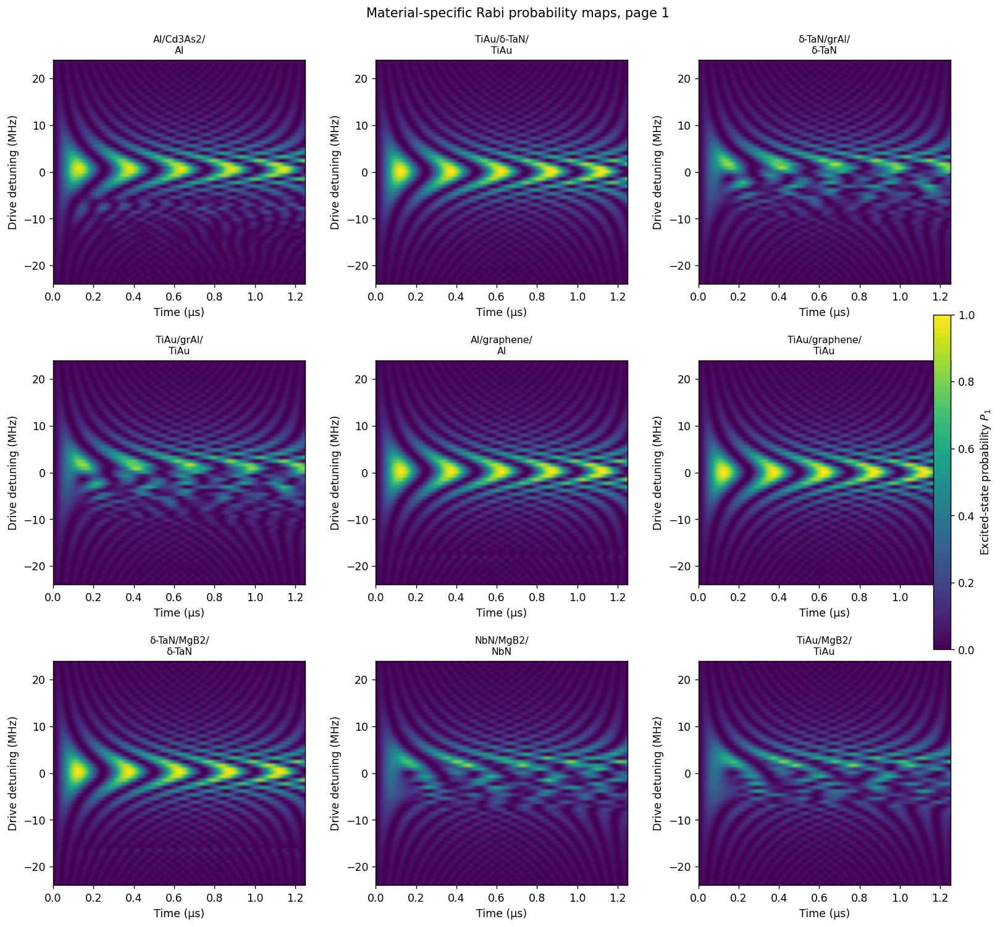

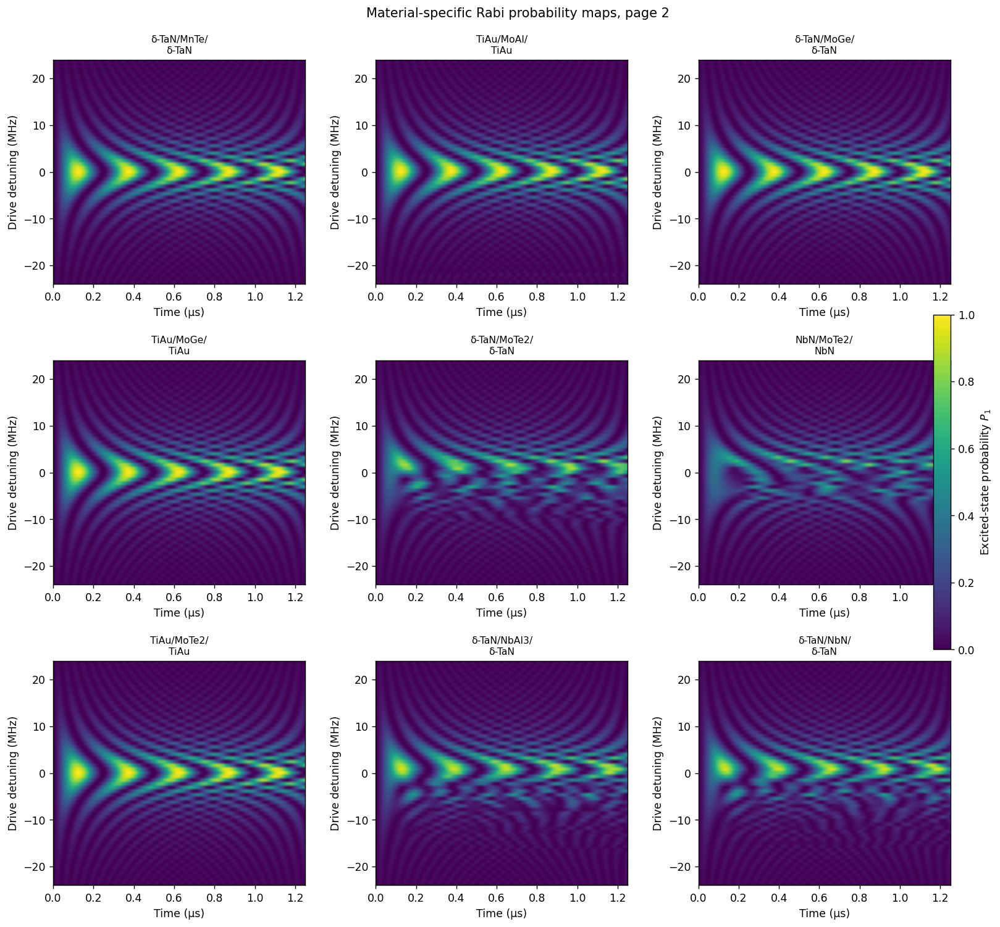

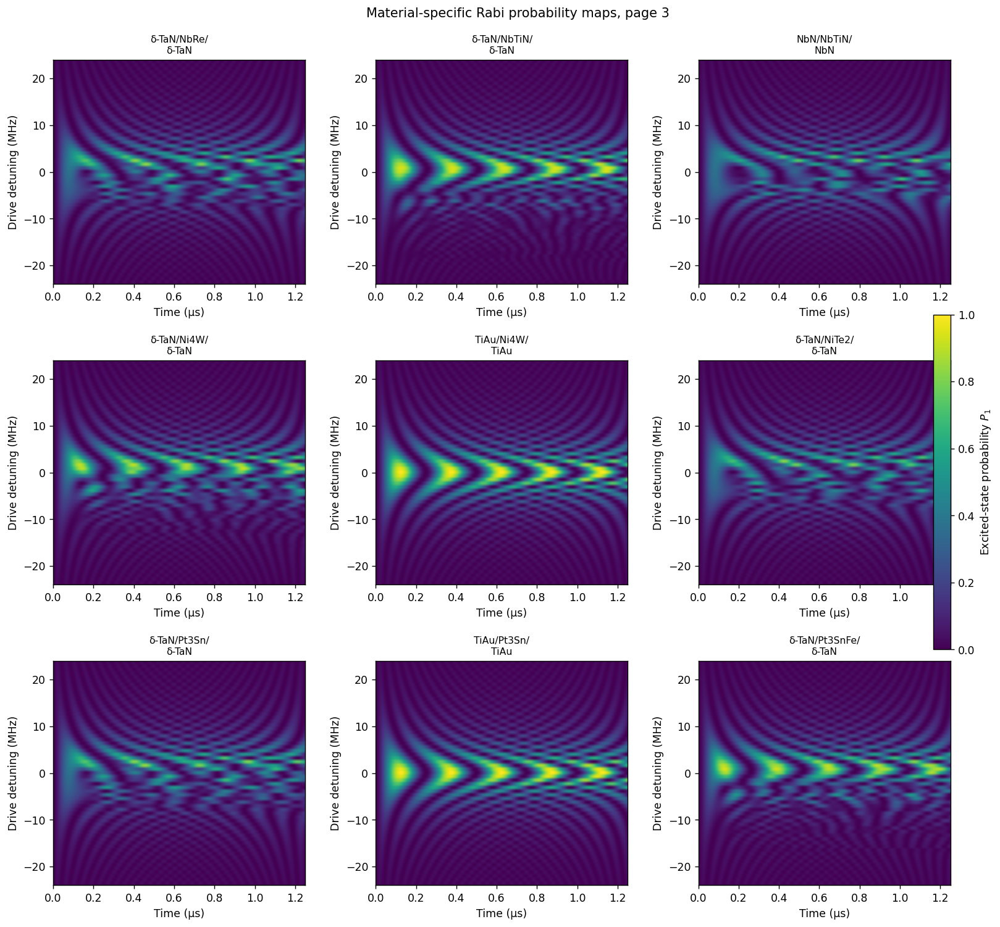

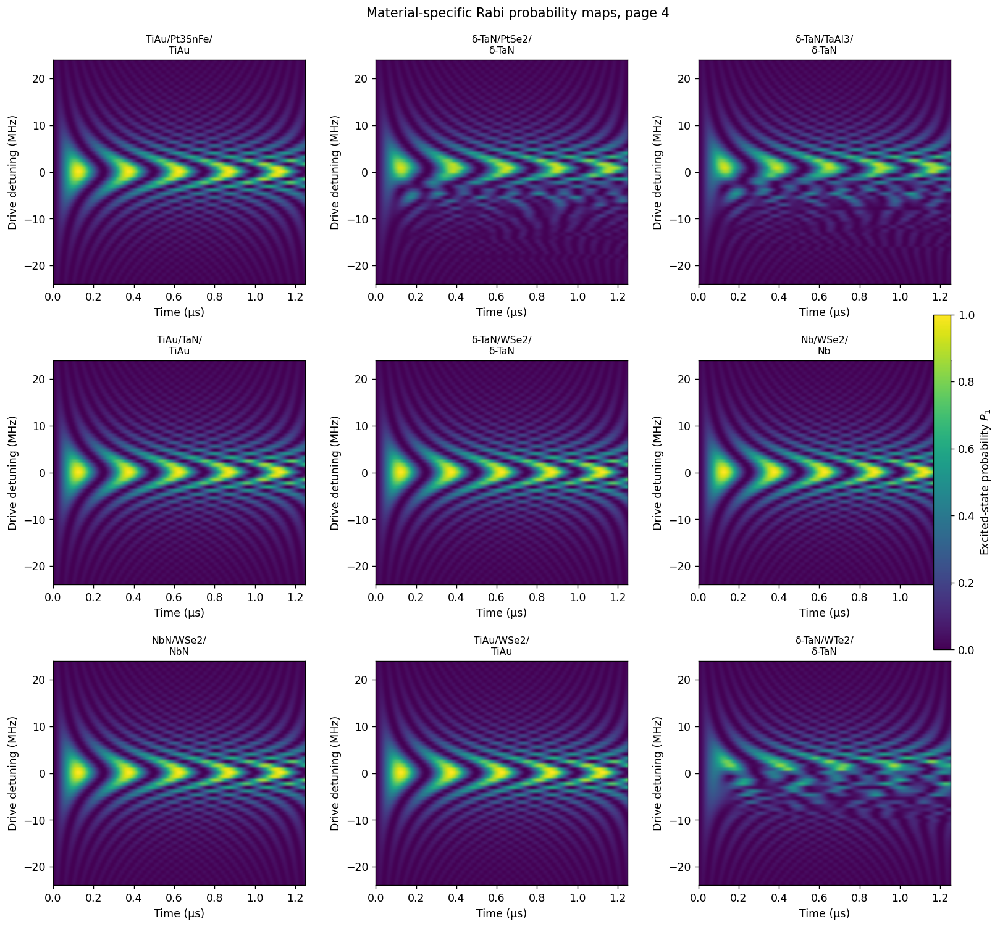

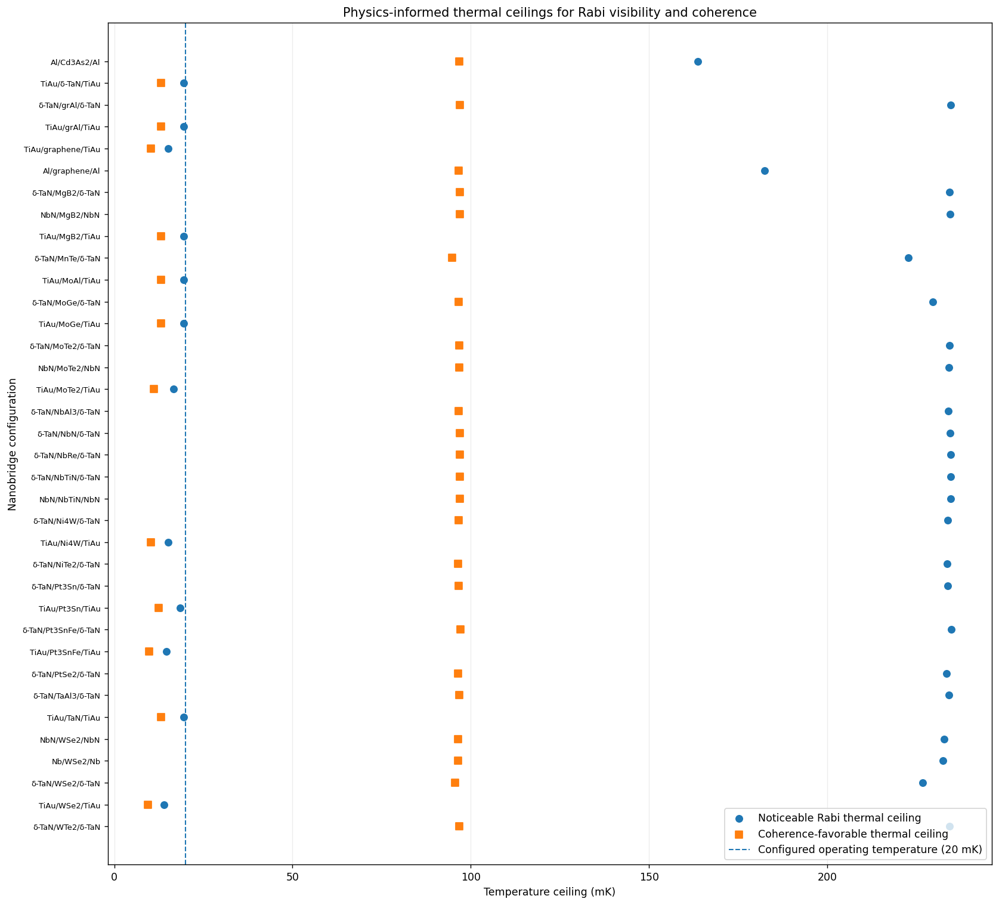

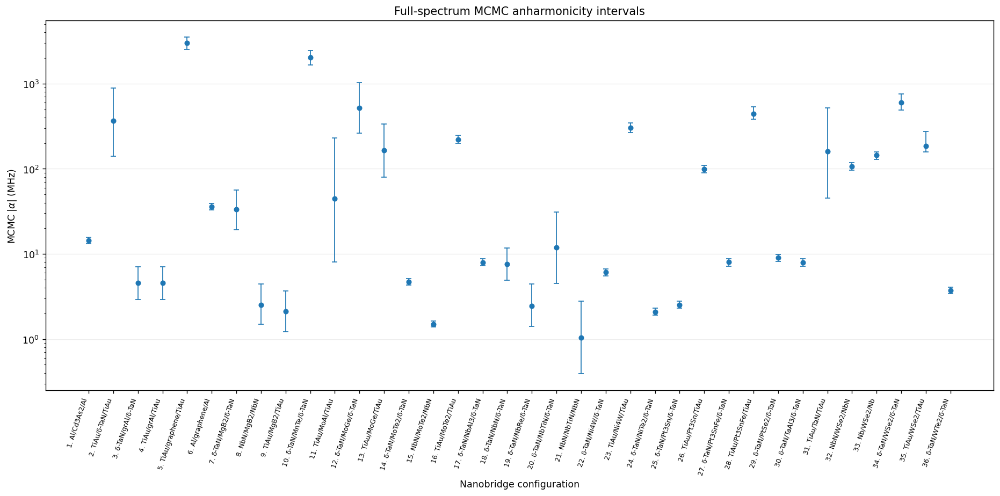